# Proposed Subject

In [1]:
import torch
import torch.nn as nn
from torchinfo import summary
import matplotlib.pyplot as plt
import os
import gc
import numpy as np
import time
import sys
sys.path.insert(1, './Alpha')
import Structure.StandardTeacher as TP
import Datasetting.DataOrganizer_old as DS
print(torch.cuda.is_available())

True


In [2]:
date = '2024_Door_RGB/Alpha/'
name = f'{date}Teacher_GEGLU'
data_path = [
#    '../dataset/Door_EXP/TrainVer/A208',
             '../dataset/Door_EXP/TrainVer/A308T',
#             '../dataset/Door_EXP/B211',
#             '../dataset/Door_EXP/C605_new'
            ]
level = 'subject'

crossvalidator = DS.CrossValidator(level, all_range=[None], subset_ratio=0.2)
data_organizer = DS.DataOrganizer(name, data_path, crossvalidator)
data_organizer.load()

Cross validation plan at subject level
Loading ../dataset/Door_EXP/TrainVer/A308T...

Loaded 0731D00-pd.npy
Loaded 0731D10-csi.npy
Loaded 0731D30-csi.npy
Loaded 0731D30-pd.npy
Loaded 0731D40-csi.npy
Loaded 20240731_131758-dpt.npy
Loaded 20240731_131758-rimg.npy
Loaded 20240731_131758-ctr.npy
Loaded 20240731_132041-cimg.npy
Loaded 20240731_132526-cimg.npy
Loaded 20240731_132526-ctr.npy
Loaded 20240731_132041-dpt.npy
Loaded 20240731_132526-dpt.npy
Loaded 20240731_132913-dpt.npy
Loaded 20240731_134148-rimg.npy
Loaded 20240731_134433-cimg.npy
Loaded 20240731_134433-rimg.npy
Loaded 20240731_134433-ctr.npy
Loaded 20240731_134901-ctr.npy
Loaded 20240731_135314-dpt.npy
Loaded 20240731_141803-rimg.npy
Loaded 20240731_142041-ctr.npy
Loaded 20240731_142041-cimg.npy
Loaded 20240731_142041-dpt.npy
Loaded 20240731_142508-dpt.npy
Loaded 20240731_142508-rimg.npy
Loaded 20240731_143016-ctr.npy
Loaded 20240731_143016-cimg.npy
Loaded 20240731_143016-dpt.npy
Loaded 20240731_144845-ctr.npy
Loaded 20240731_

/mnt/datastore/Models/Datasetting/DataOrganizer_old.py:181: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.total_segment_labels = pd.concat([self.total_segment_labels, sub_label], ignore_index=True)


Loaded 0731D50-pd.npy
Loaded 20240731_132913-rimg.npy
Loaded 20240731_135314-ctr.npy
Loaded 20240731_134901-rimg.npy
Loaded 20240731_135314-rimg.npy
Loaded 0731D20-pd.npy
Loaded 0731D10-pd.npy
Loaded 20240731_132913-cimg.npy
Loaded 20240731_141803-dpt.npy
Loaded 20240731_134148-cimg.npy
Loaded 0731D21-csi.npy
Loaded 20240731_141803-ctr.npy
Loaded 20240731_131758-cimg.npy
Loaded 0731D40-pd.npy
Loaded 20240731_135314-cimg.npy
Loaded 20240731_142508-ctr.npy
Loaded 20240731_150445-ctr.npy
Loaded 20240731_152721-ctr.npy
Loaded 20240731_152721-dpt.npy
Loaded 20240731_153002-cimg.npy
Loaded 20240731_153350-ctr.npy
Loaded 20240731_153744-cimg.npy
Loaded 20240731_153744-ctr.npy
Loaded 20240731_154527-cimg.npy
Loaded 20240731_154527-ctr.npy
Loaded 20240731_154527-dpt.npy
Loaded 20240731_154527-rimg.npy
Loaded 20240731_155303-dpt.npy
Loaded 20240731_155303-rimg.npy
Loaded matched-higashinaka.csv
Loaded matched-jiao.csv
Loaded matched-qiao.csv
Loaded 0731D00-csi.npy

Load complete!
Cross validator

In [3]:
data_organizer.load_plan('../dataset/Door_EXP/subject_r0.2_A308T.pkl')
data_organizer.gen_plan()

Data Organizer: Loaded plan!


In [4]:
train_loader, valid_loader, test_loader, current_test = data_organizer.gen_loaders(num_workers=2, batch_size=64)

Data Organizer: Generating loaders for s: current test = qiao
 Train/Valid dataset length = 6429
 Test dataset length = 2253
 Exported train loader of len 80, batch size = 64

 Exported valid loader of len 20, batch size = 64

 Exported test loader of len 35, batch size = 64



### Teacher

==========2025-05-22 08:05:55 2024_Door_RGB/Alpha/Teacher_GEGLU Teacher Training starting==========


  0%|1                                                                                                        …

  0%|                                                                                                         …

main imgen cnn.0.weight: requires_grad=True
main imgen cnn.0.bias: requires_grad=True
main imgen cnn.3.weight: requires_grad=True
main imgen cnn.3.bias: requires_grad=True
main imgen cnn.6.weight: requires_grad=True
main imgen cnn.6.bias: requires_grad=True
main imgen cnn.9.weight: requires_grad=True
main imgen cnn.9.bias: requires_grad=True
main imgen cnn.12.weight: requires_grad=True
main imgen cnn.12.bias: requires_grad=True
main imgen cnn.15.weight: requires_grad=True
main imgen cnn.15.bias: requires_grad=True
main imgen cnn.18.weight: requires_grad=True
main imgen cnn.18.bias: requires_grad=True
main imgen cnn.21.weight: requires_grad=True
main imgen cnn.21.bias: requires_grad=True
main imgen cnn.22.weight: requires_grad=True
main imgen cnn.22.bias: requires_grad=True
main imgen fc_mu.0.weight: requires_grad=True
main imgen fc_mu.0.bias: requires_grad=True
main imgen fc_logvar.0.weight: requires_grad=True
main imgen fc_logvar.0.bias: requires_grad=True
main cimgde cnn.0.weight: re

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

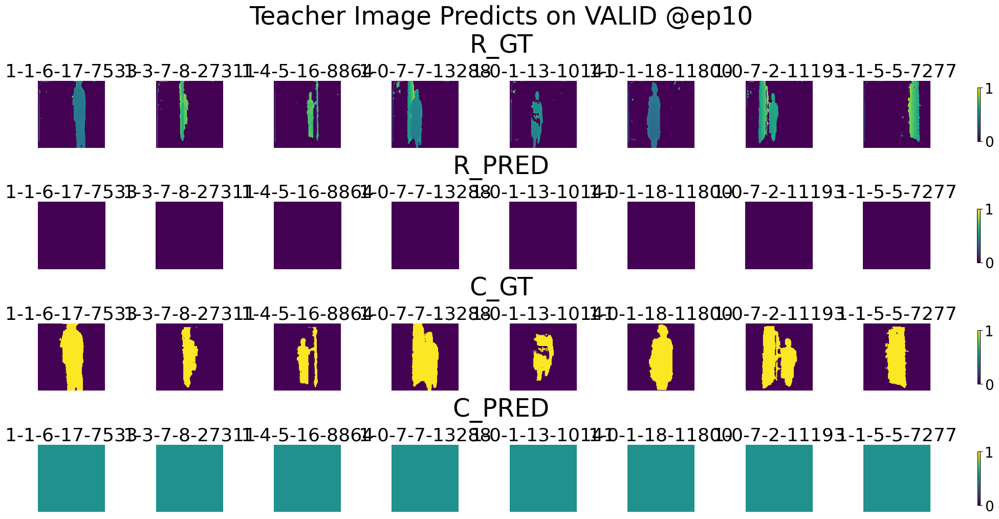

<Figure size 2000x1000 with 0 Axes>

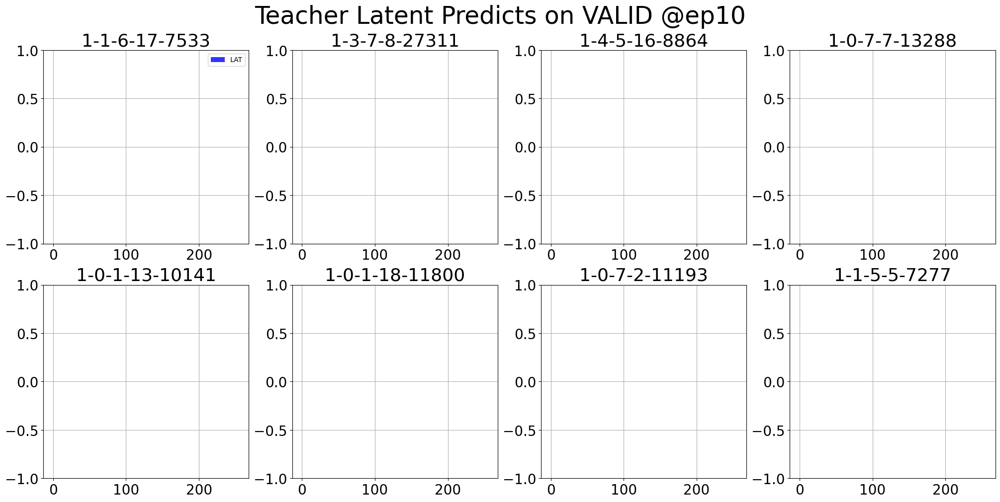

<Figure size 2000x1000 with 0 Axes>

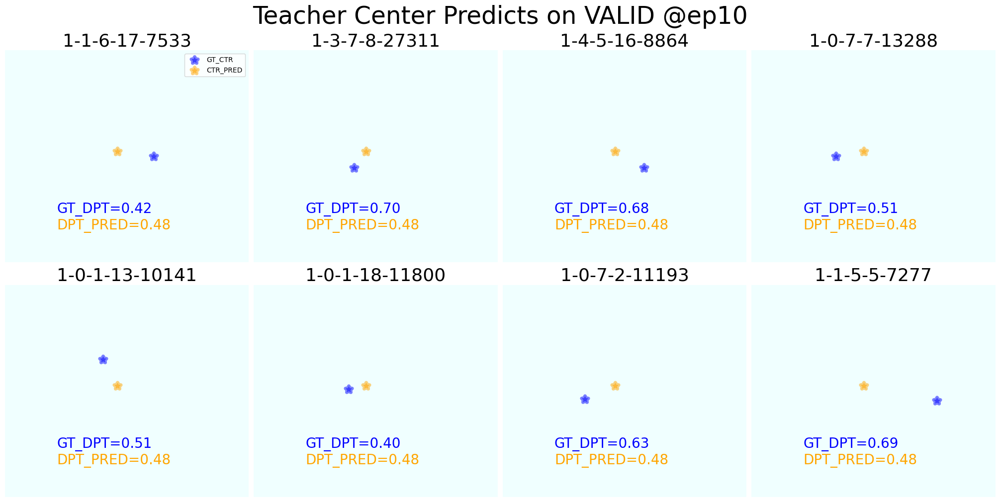

<Figure size 2000x1000 with 0 Axes>

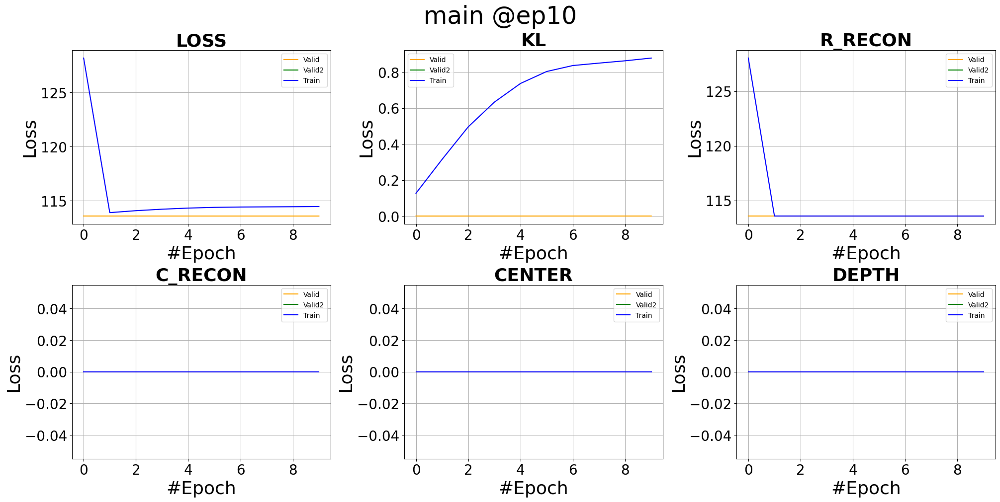

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

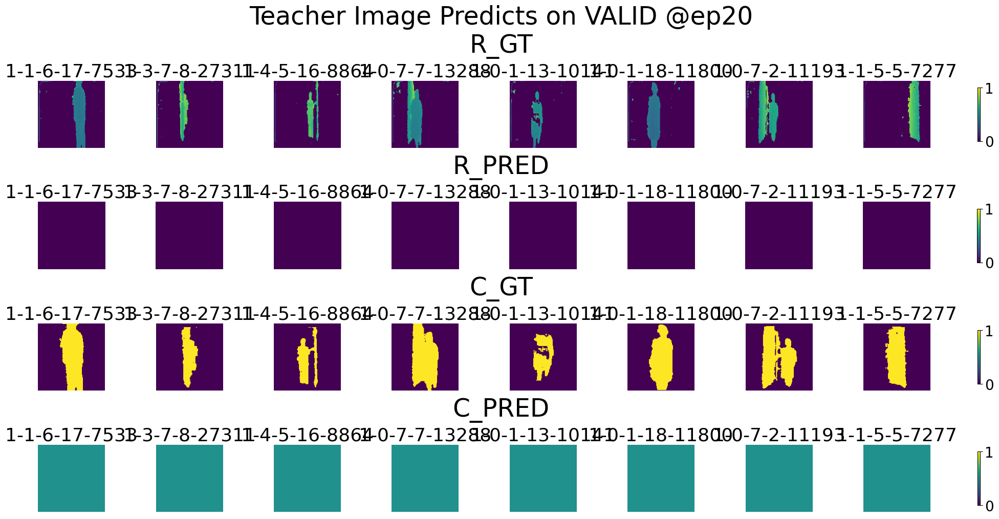

<Figure size 2000x1000 with 0 Axes>

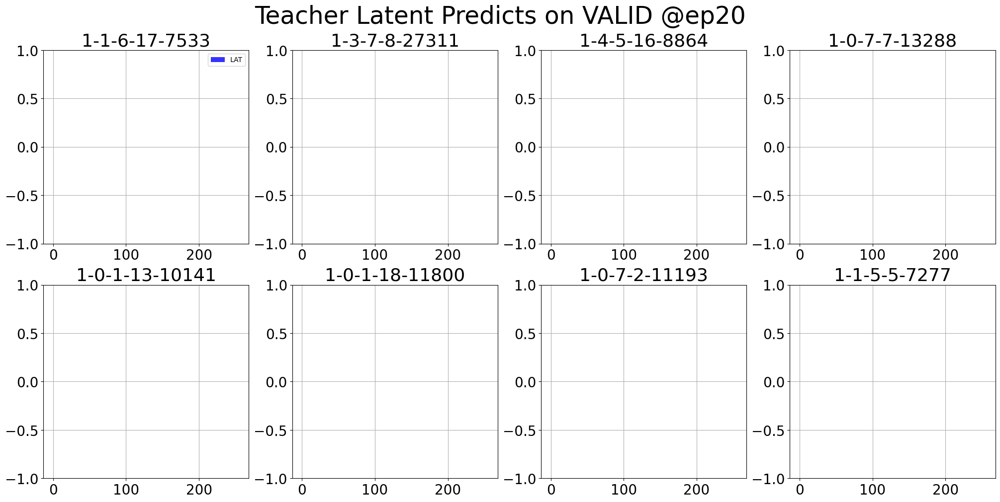

<Figure size 2000x1000 with 0 Axes>

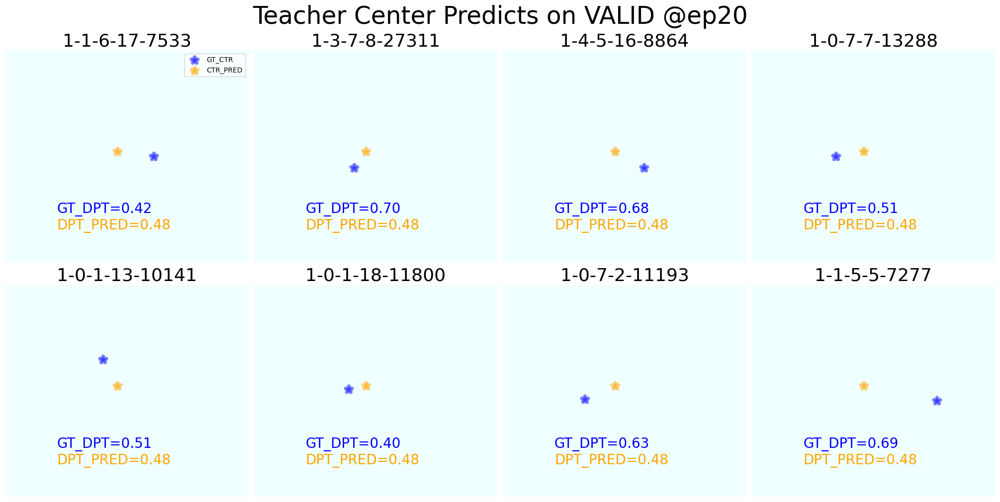

<Figure size 2000x1000 with 0 Axes>

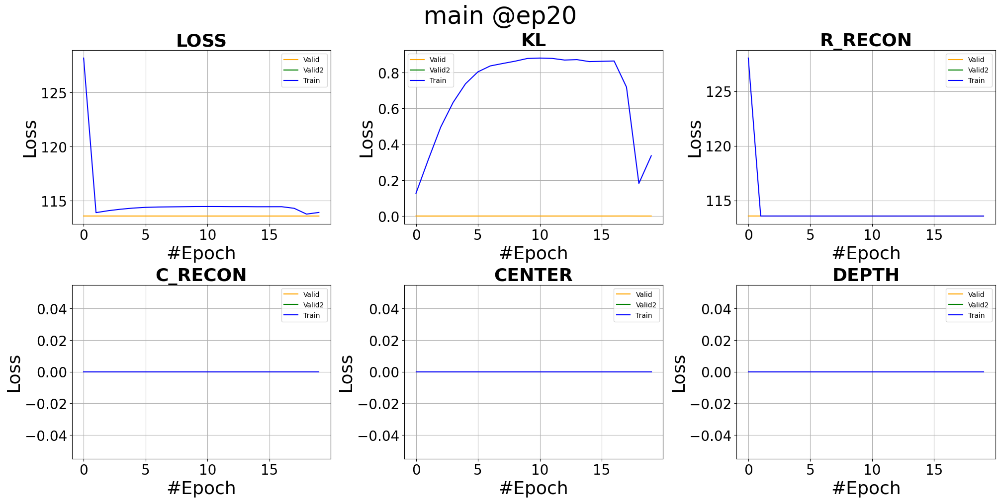

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

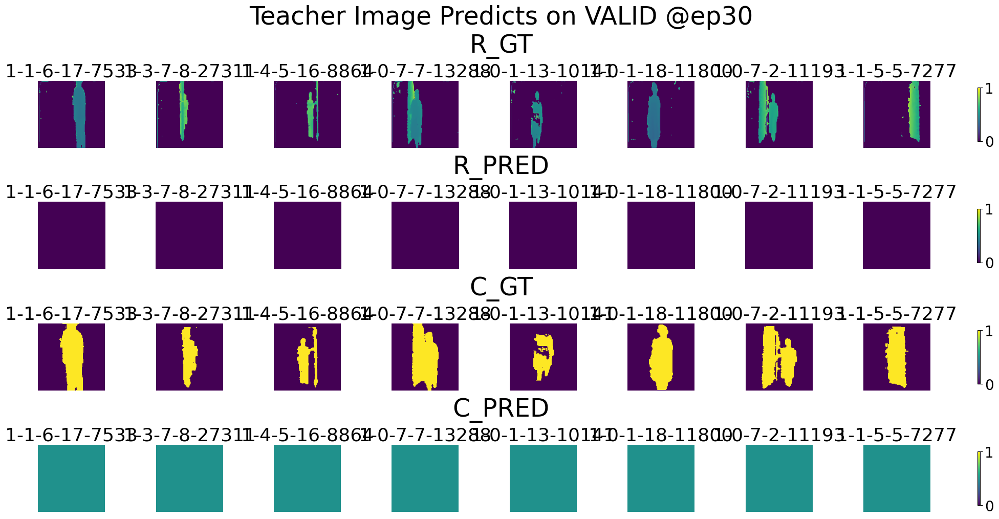

<Figure size 2000x1000 with 0 Axes>

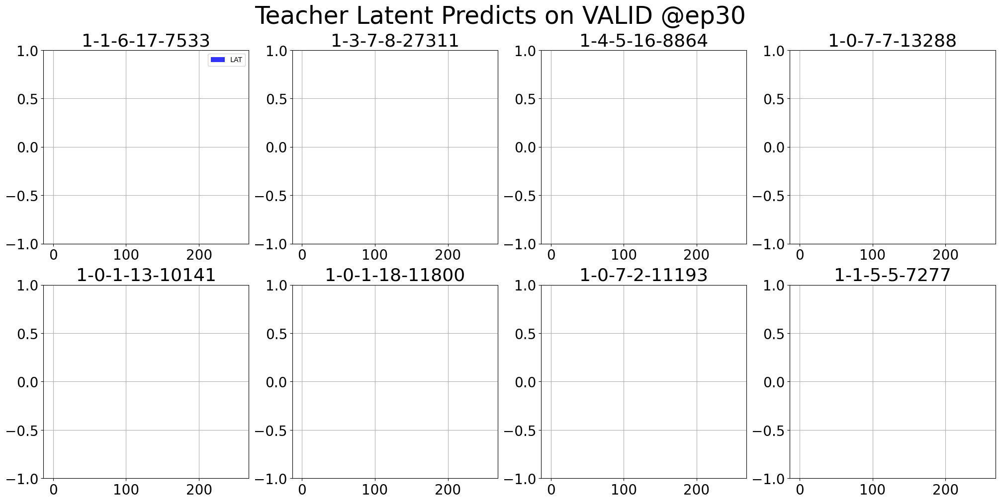

<Figure size 2000x1000 with 0 Axes>

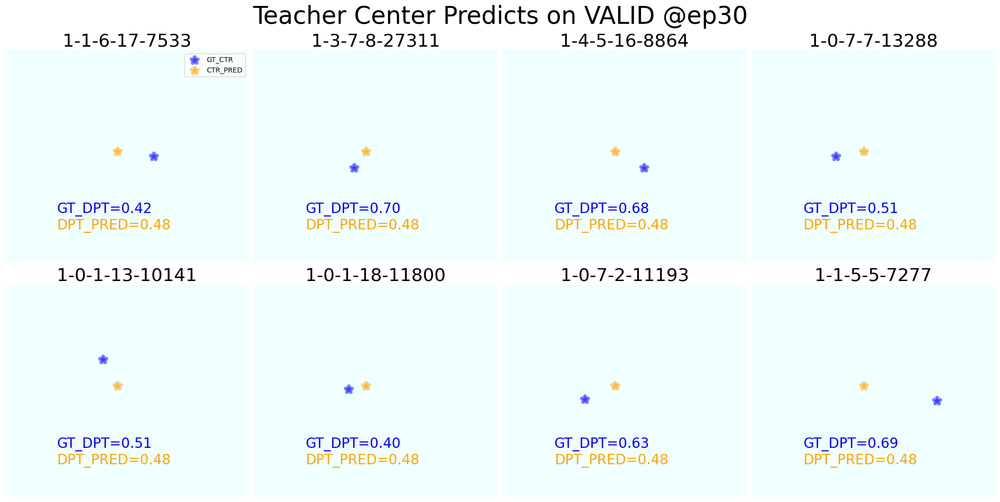

<Figure size 2000x1000 with 0 Axes>

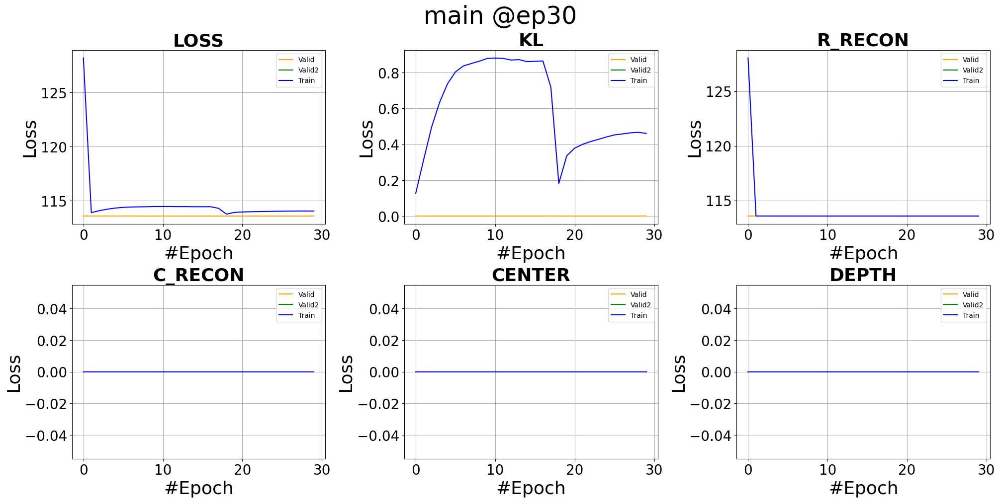

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

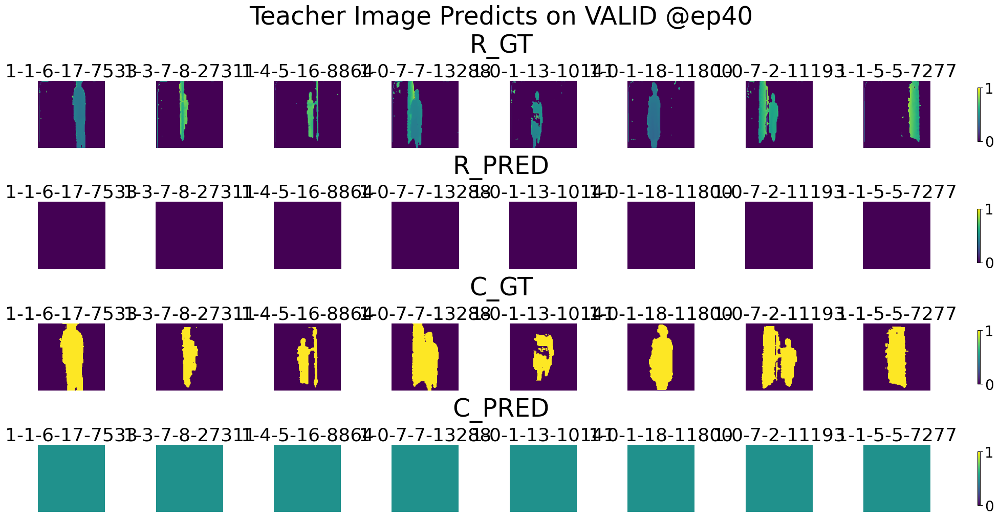

<Figure size 2000x1000 with 0 Axes>

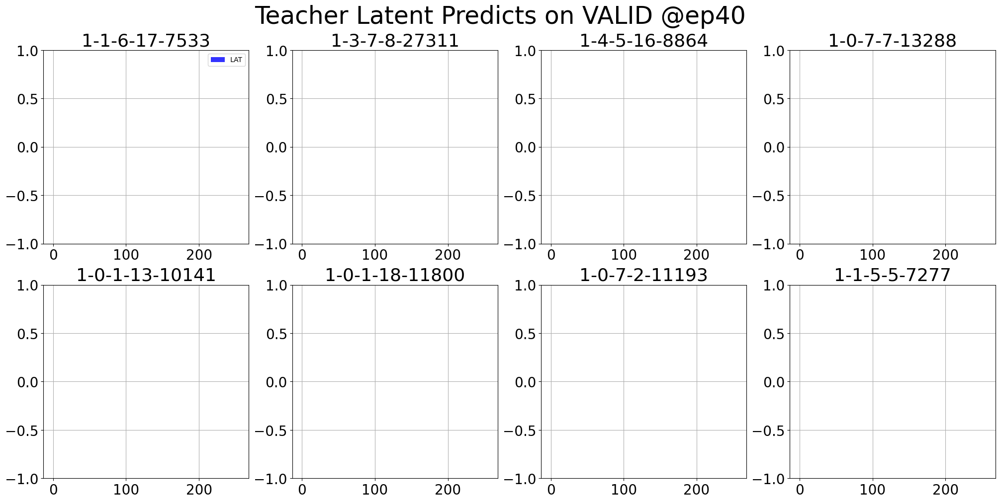

<Figure size 2000x1000 with 0 Axes>

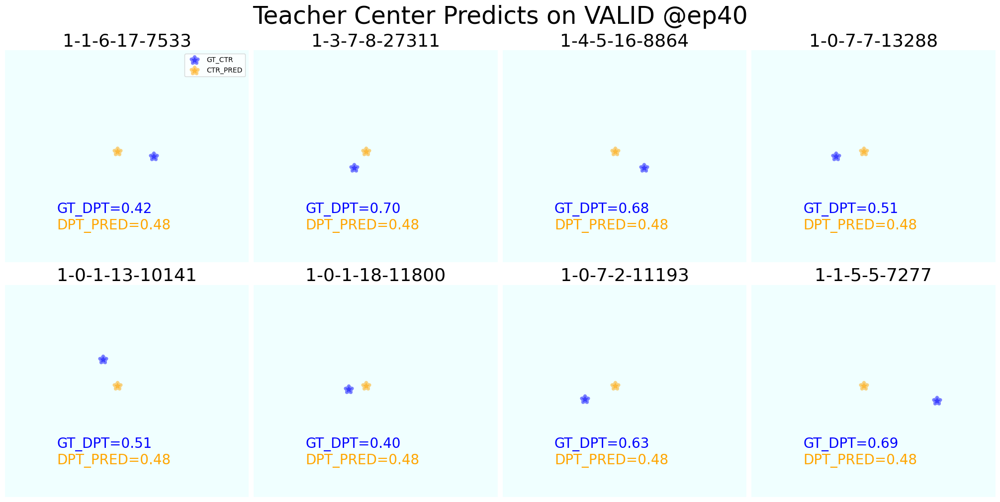

<Figure size 2000x1000 with 0 Axes>

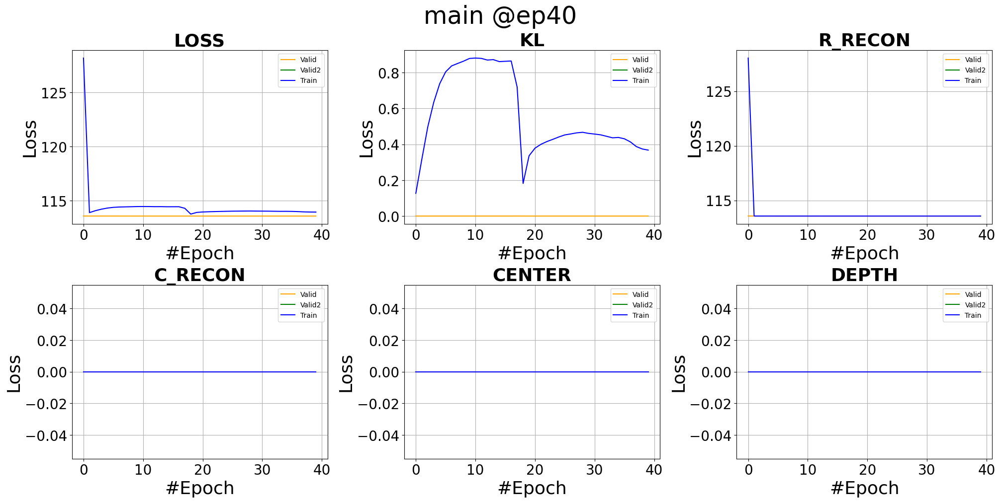

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

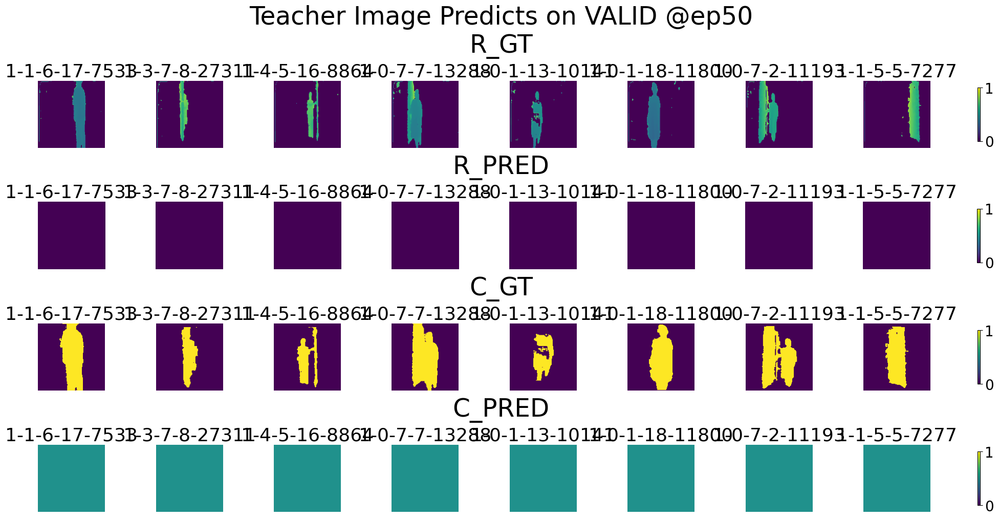

<Figure size 2000x1000 with 0 Axes>

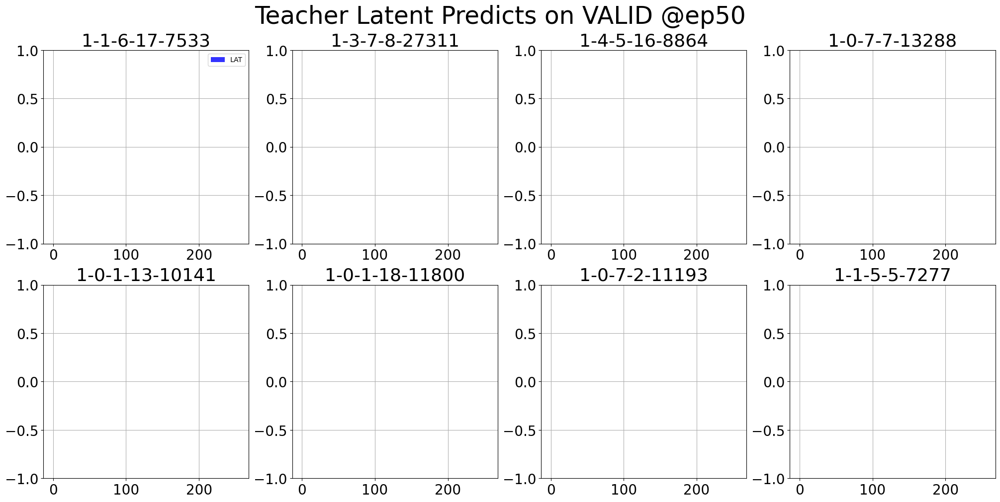

<Figure size 2000x1000 with 0 Axes>

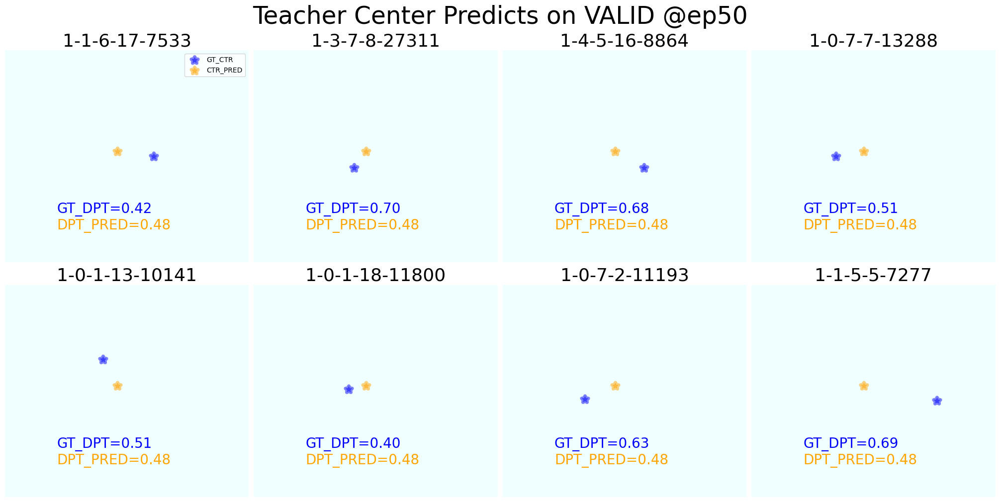

<Figure size 2000x1000 with 0 Axes>

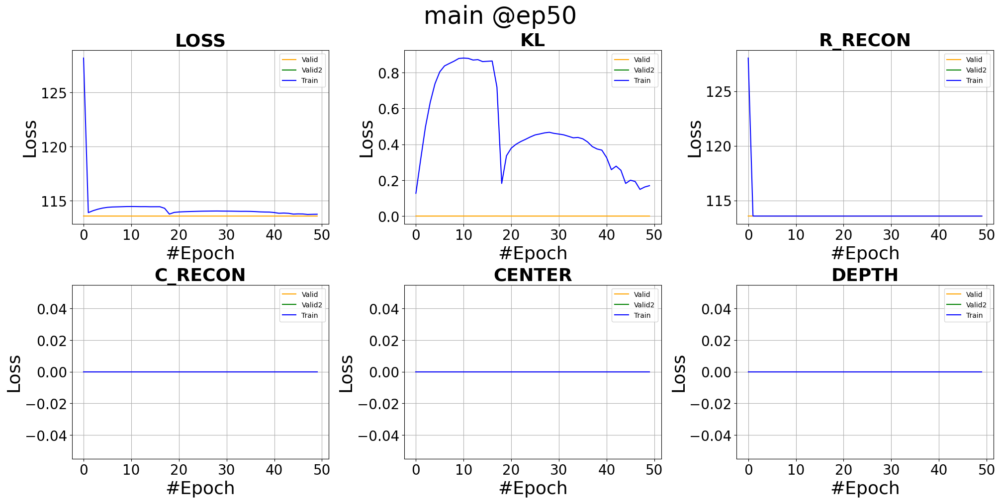

Saving models...
Saving imgen...
Saving cimgde...
Saving rimgde...
Saving ctrde...
Saving main optimizer...
All saved!



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

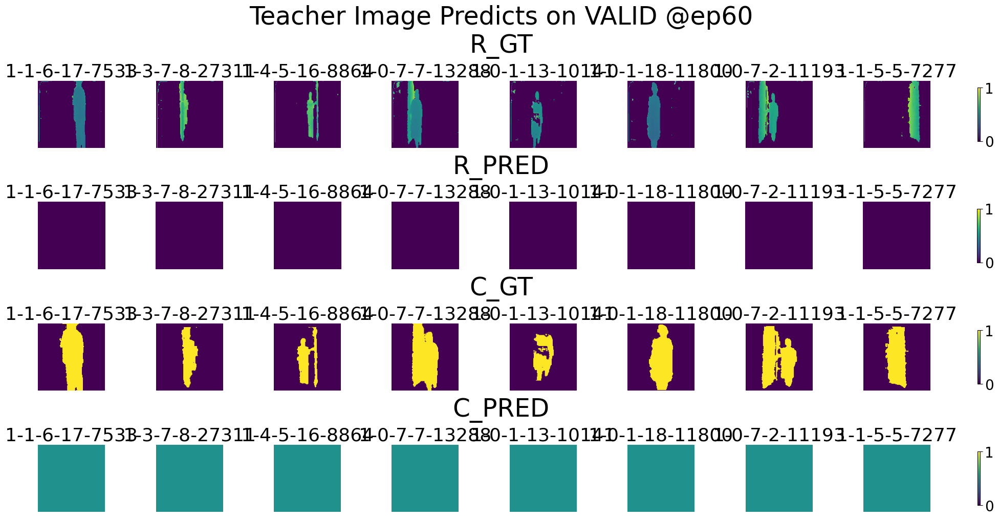

<Figure size 2000x1000 with 0 Axes>

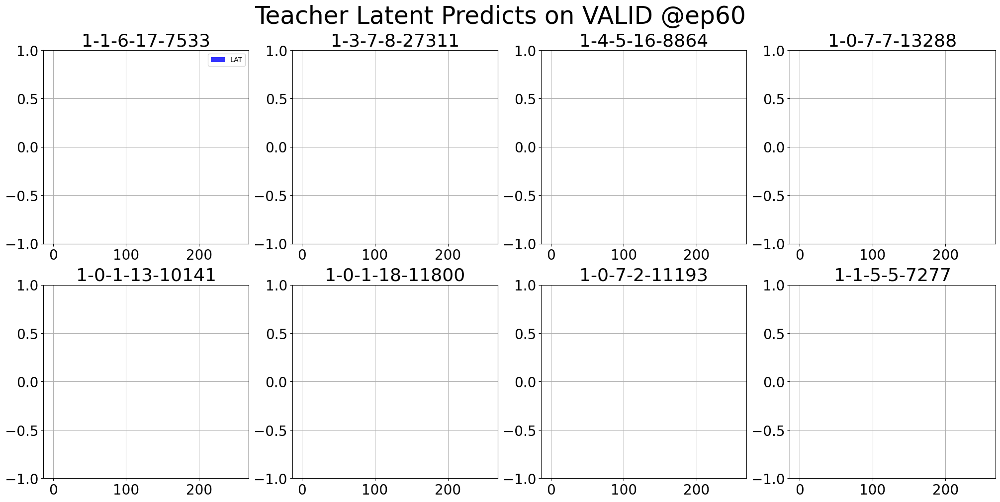

<Figure size 2000x1000 with 0 Axes>

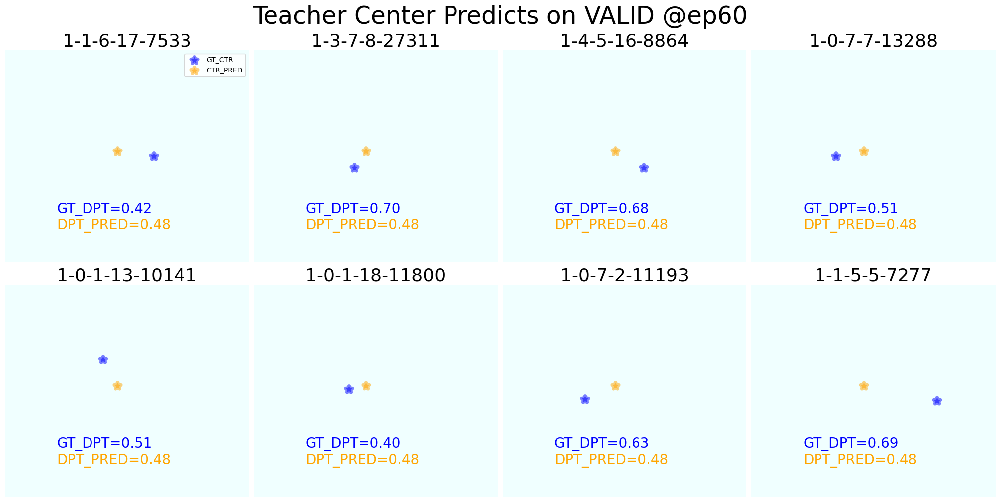

<Figure size 2000x1000 with 0 Axes>

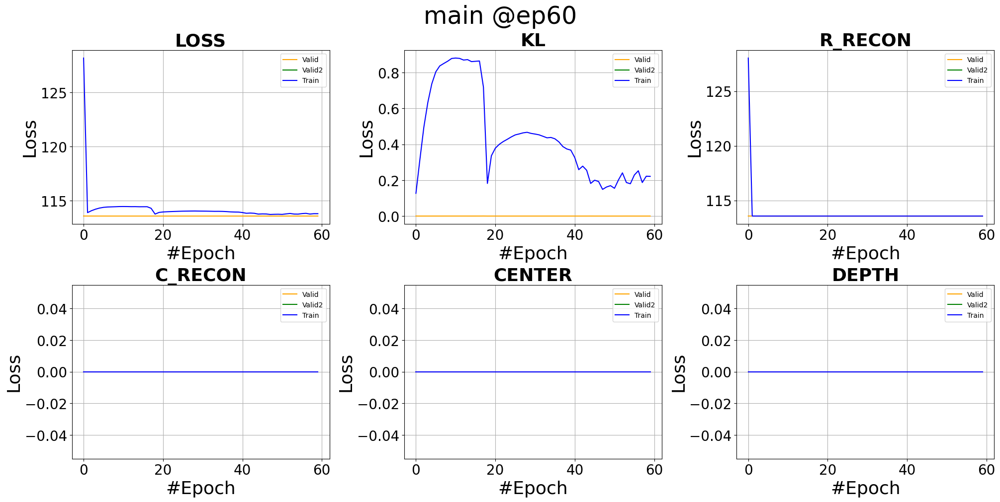

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

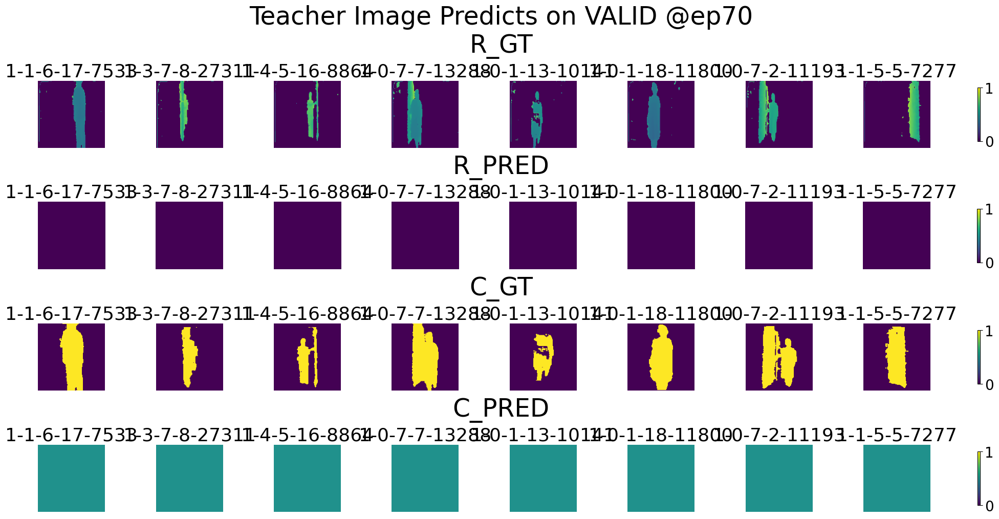

<Figure size 2000x1000 with 0 Axes>

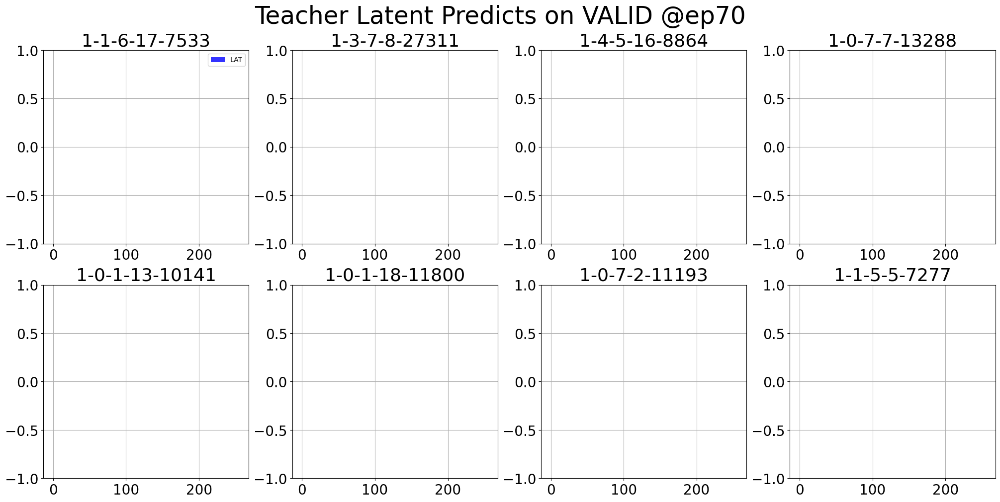

<Figure size 2000x1000 with 0 Axes>

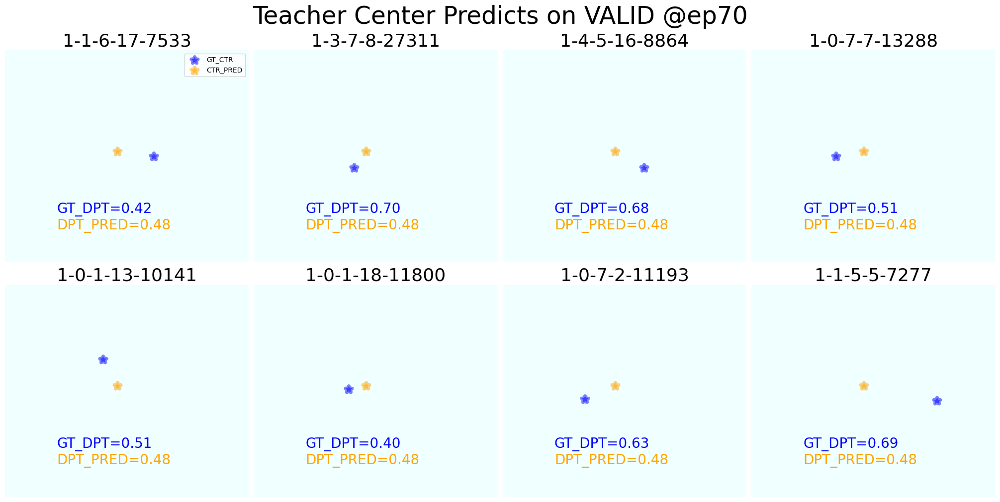

<Figure size 2000x1000 with 0 Axes>

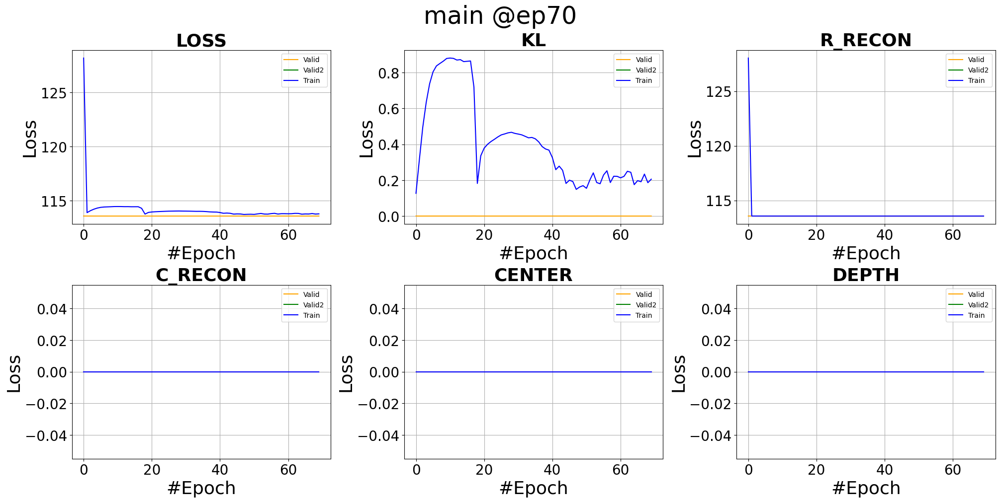

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

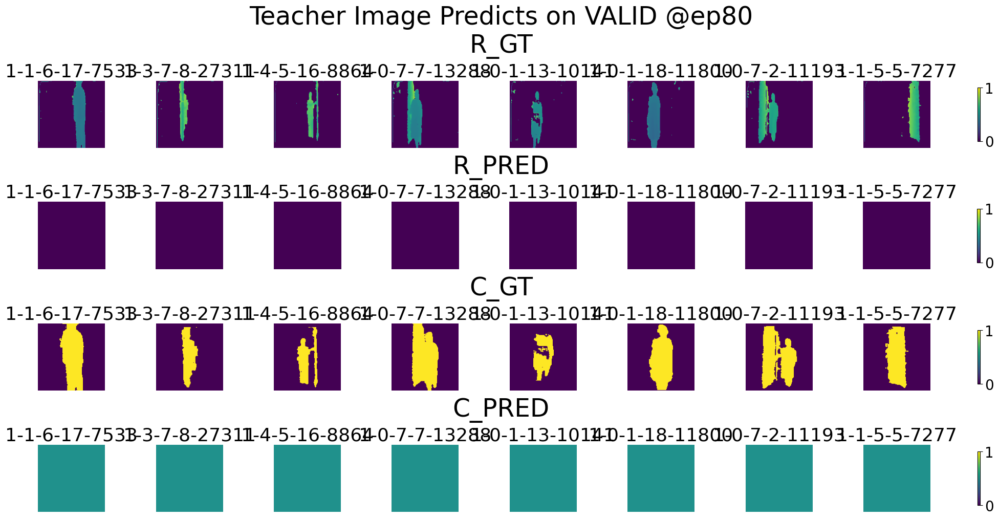

<Figure size 2000x1000 with 0 Axes>

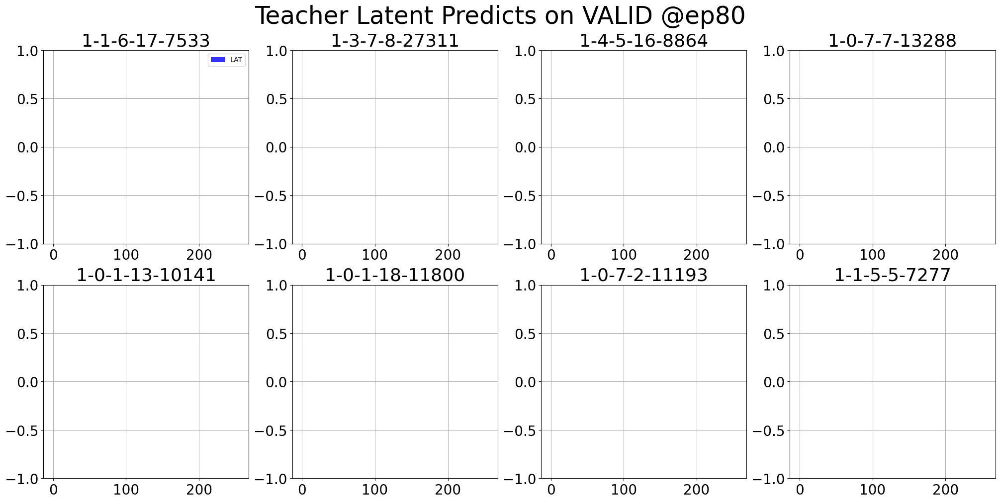

<Figure size 2000x1000 with 0 Axes>

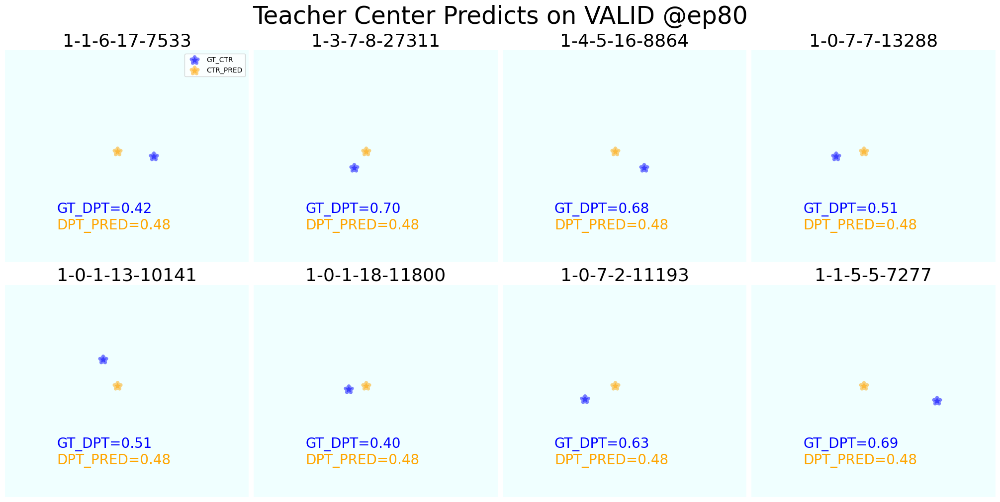

<Figure size 2000x1000 with 0 Axes>

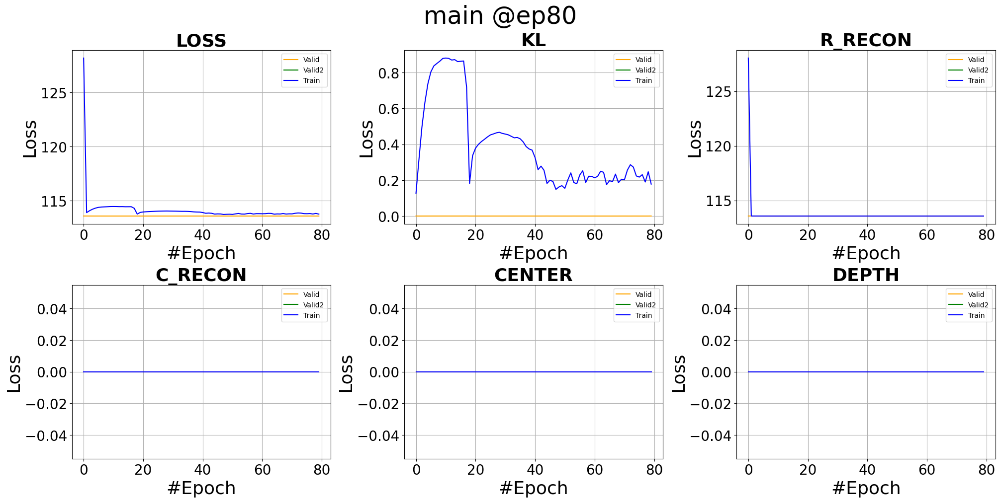

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

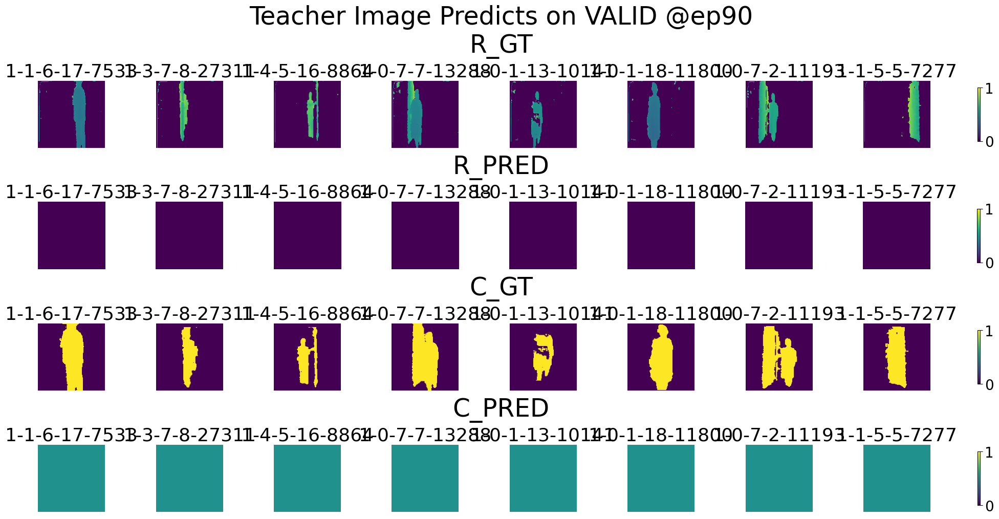

<Figure size 2000x1000 with 0 Axes>

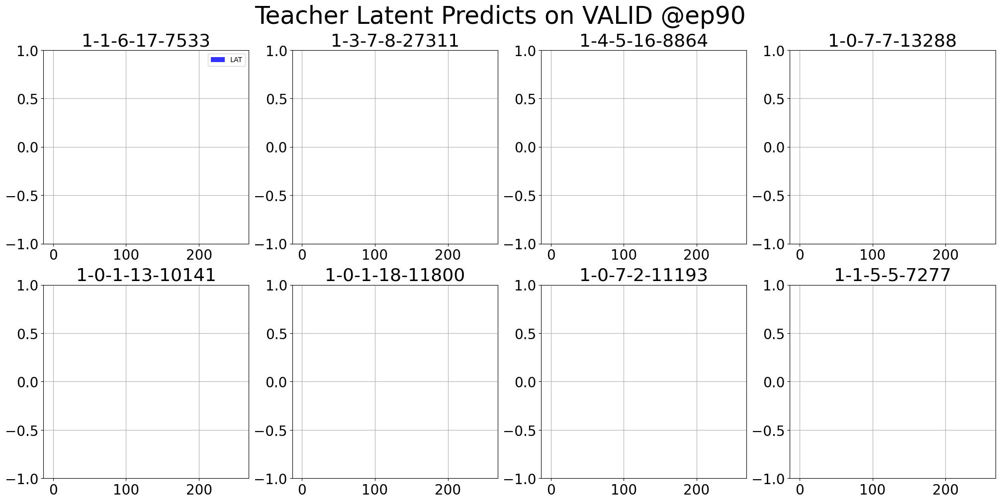

<Figure size 2000x1000 with 0 Axes>

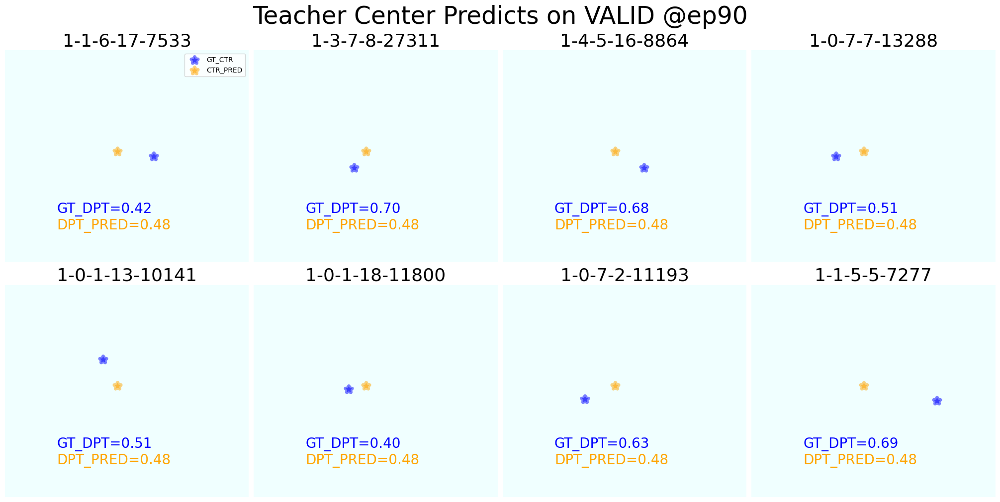

<Figure size 2000x1000 with 0 Axes>

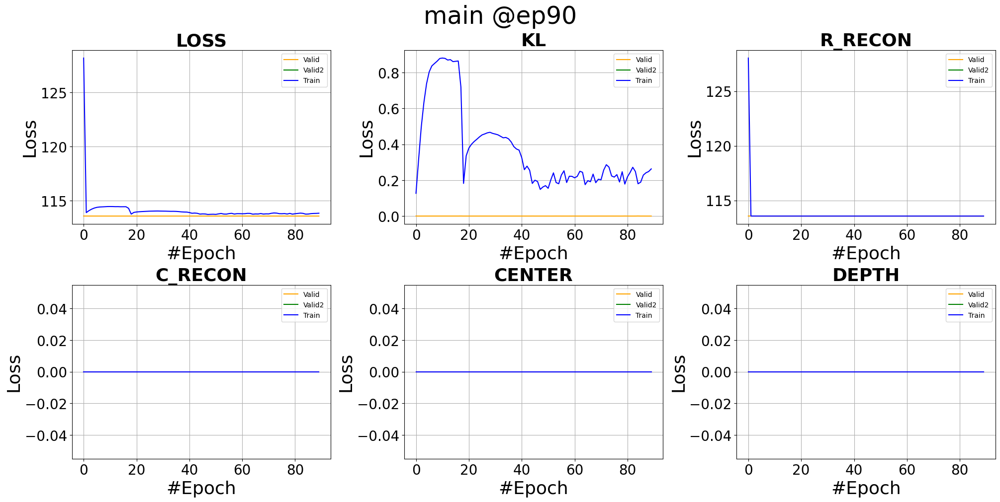

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

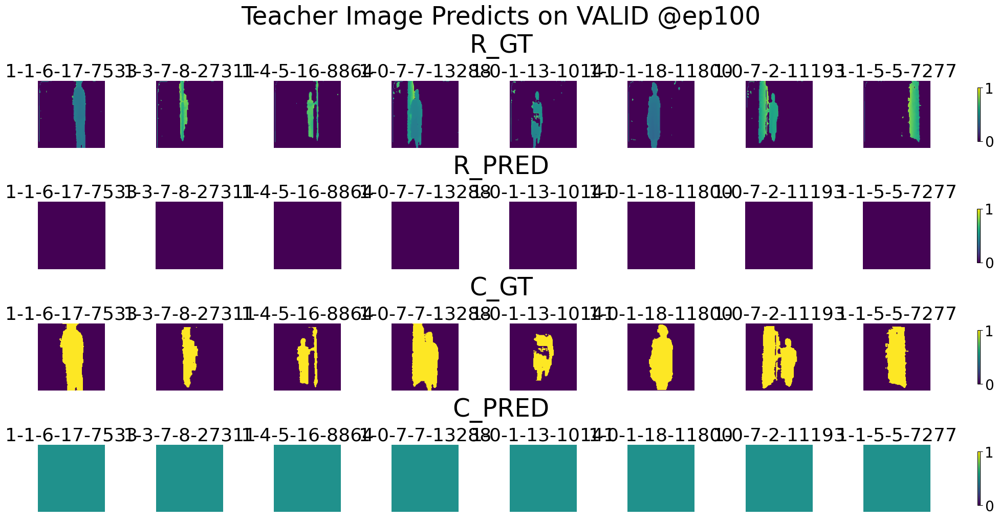

<Figure size 2000x1000 with 0 Axes>

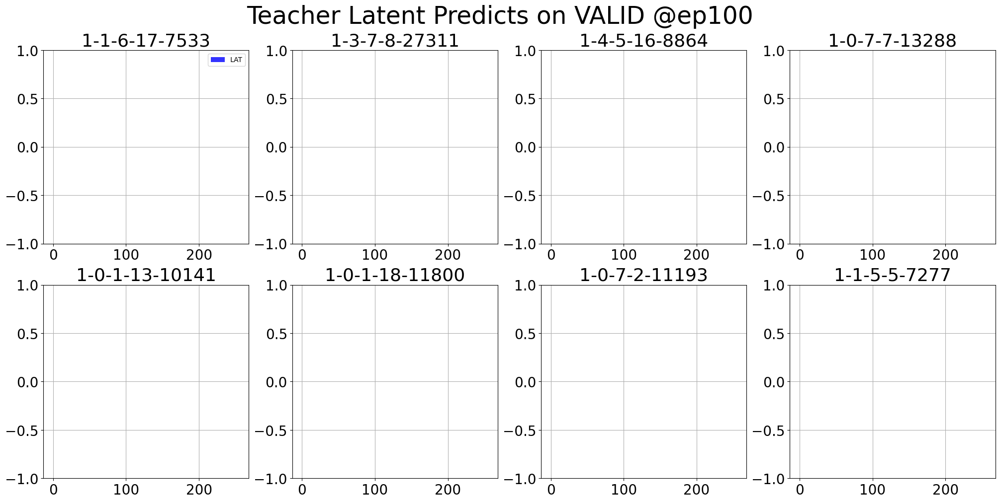

<Figure size 2000x1000 with 0 Axes>

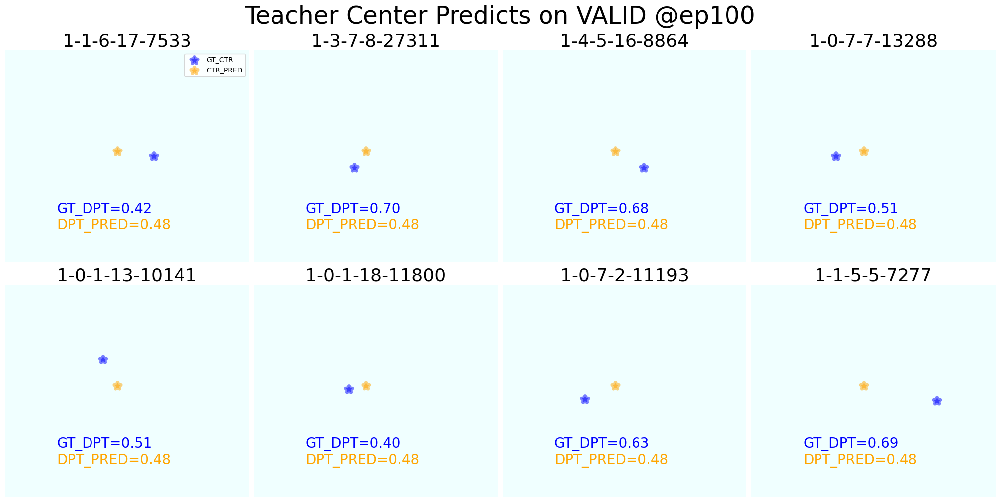

<Figure size 2000x1000 with 0 Axes>

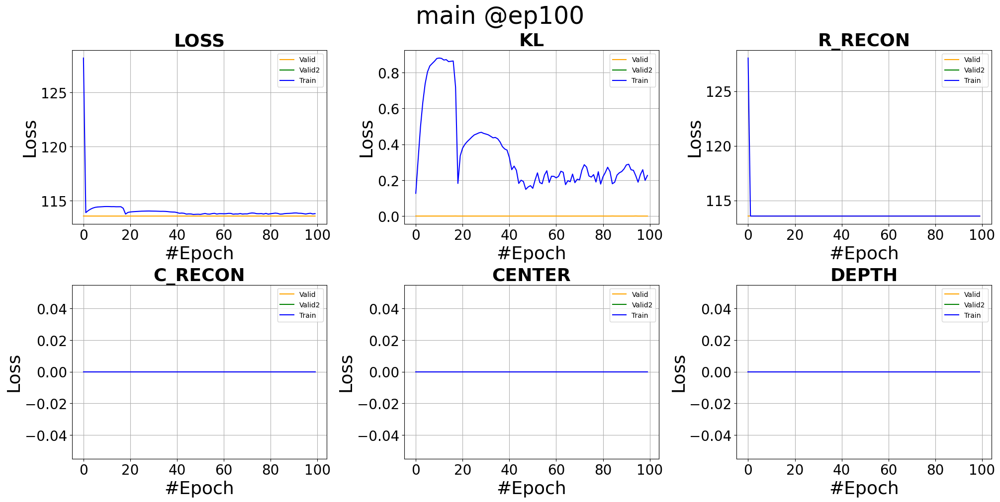

Saving models...
Saving imgen...
Saving cimgde...
Saving rimgde...
Saving ctrde...
Saving main optimizer...
All saved!



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 1 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 2 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 3 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 4 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 5 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 6 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 1 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 2 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

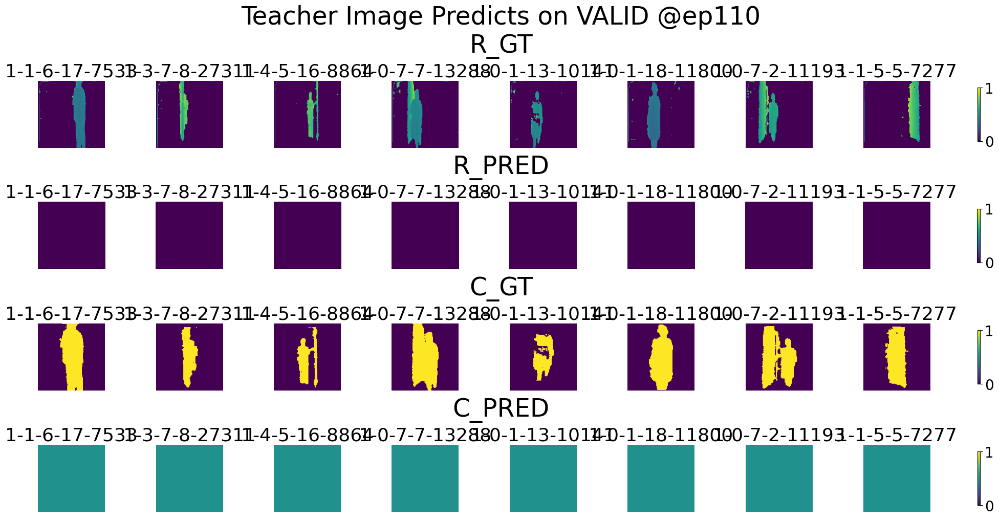

<Figure size 2000x1000 with 0 Axes>

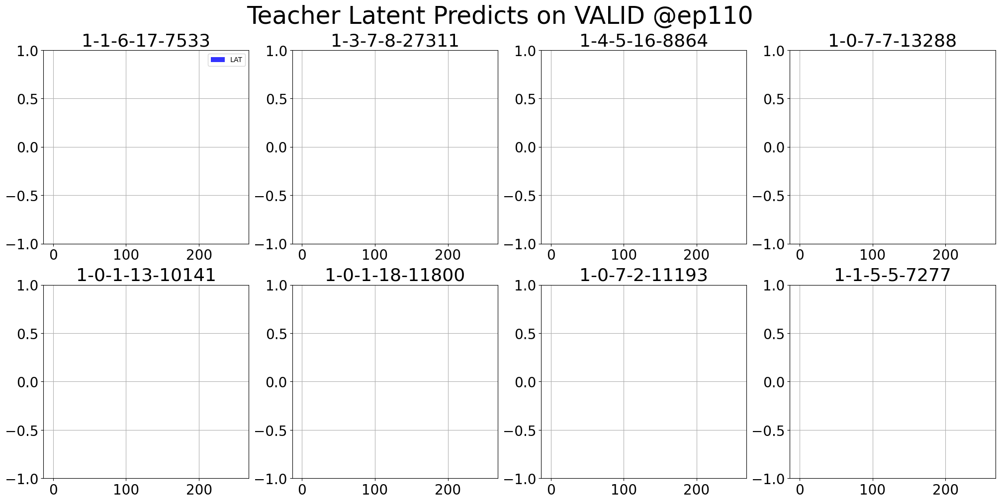

<Figure size 2000x1000 with 0 Axes>

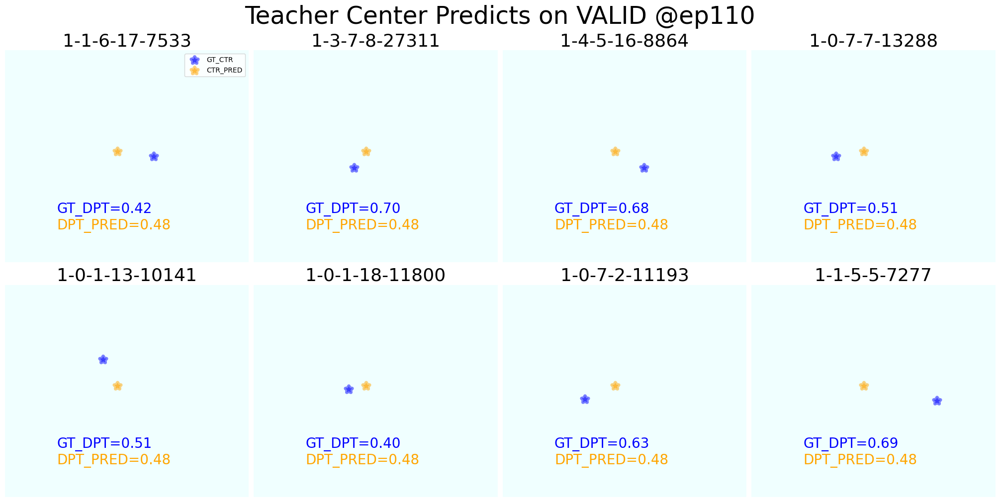

<Figure size 2000x1000 with 0 Axes>

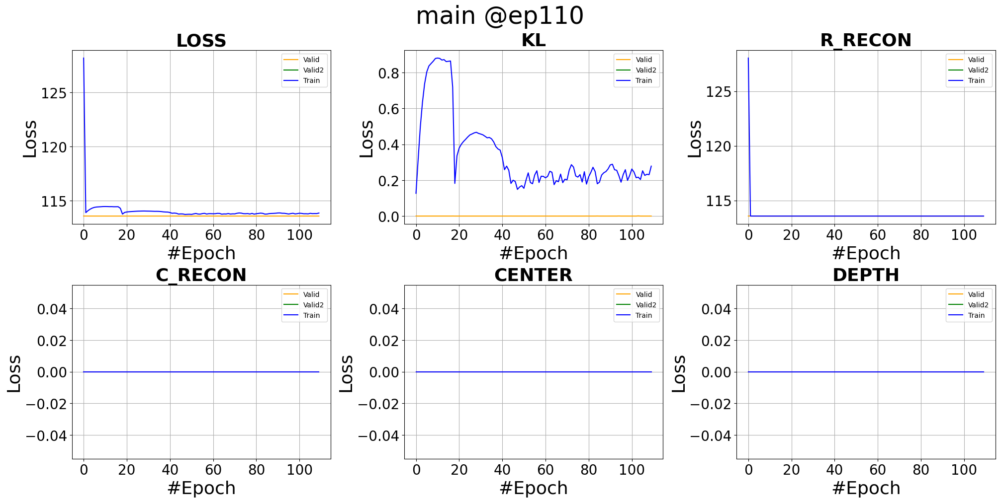

Early Stopping reporting: 3 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 4 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 5 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 6 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 7 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 8 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 9 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 10 out of 10
Lr decay reporting: 1 out of 5. Decay rate = 0.5



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 1 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 2 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

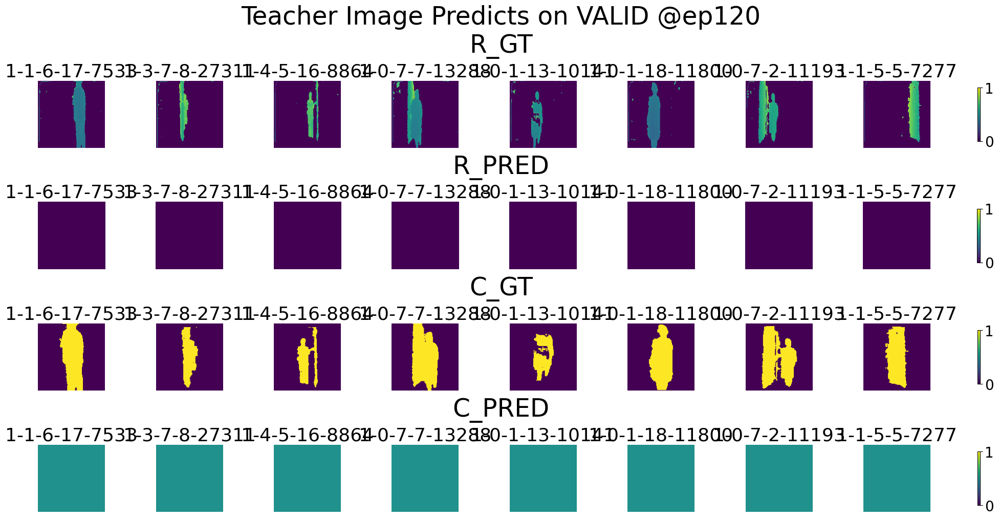

<Figure size 2000x1000 with 0 Axes>

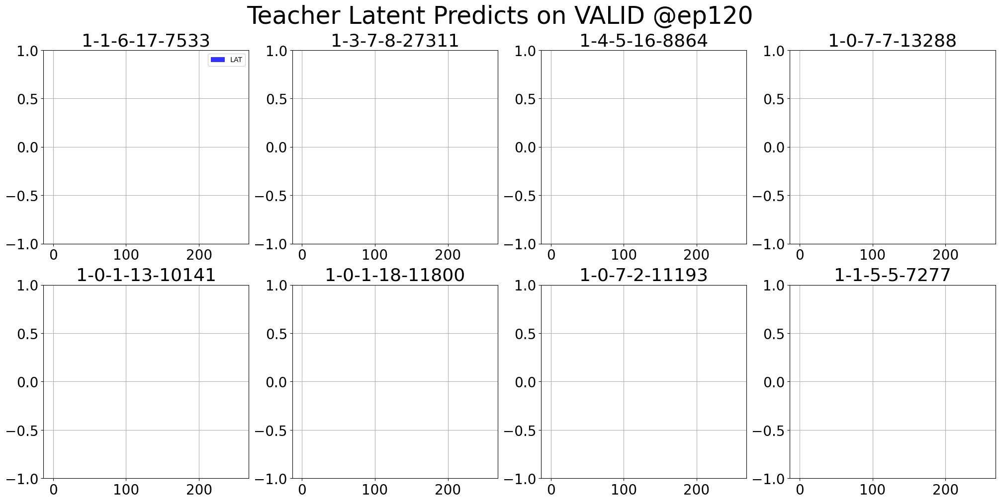

<Figure size 2000x1000 with 0 Axes>

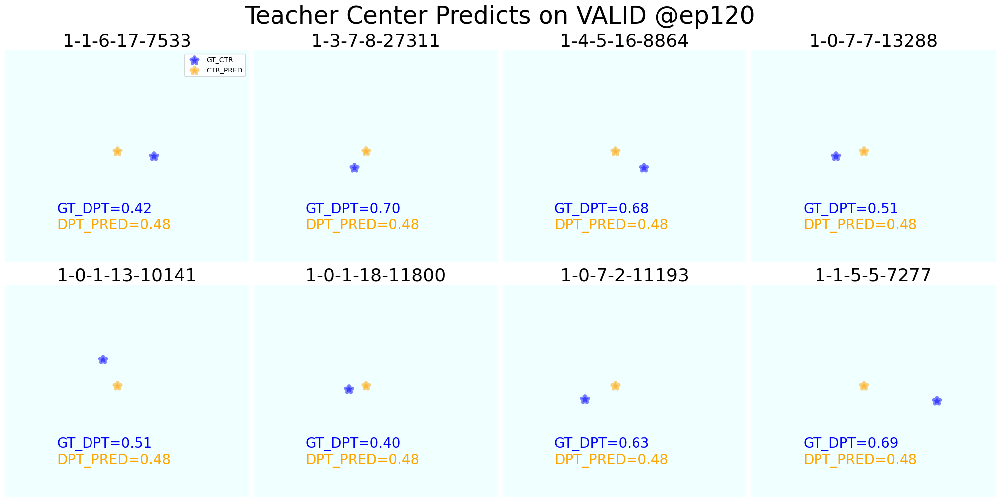

<Figure size 2000x1000 with 0 Axes>

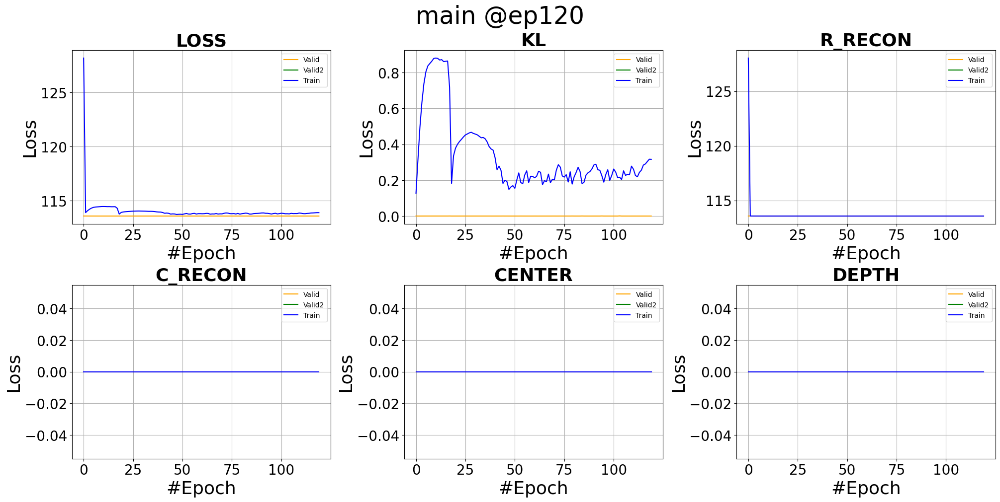

Early Stopping reporting: 3 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 4 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 5 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 6 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 7 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 8 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 9 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 10 out of 10
Lr decay reporting: 2 out of 5. Decay rate = 0.25



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 1 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 2 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

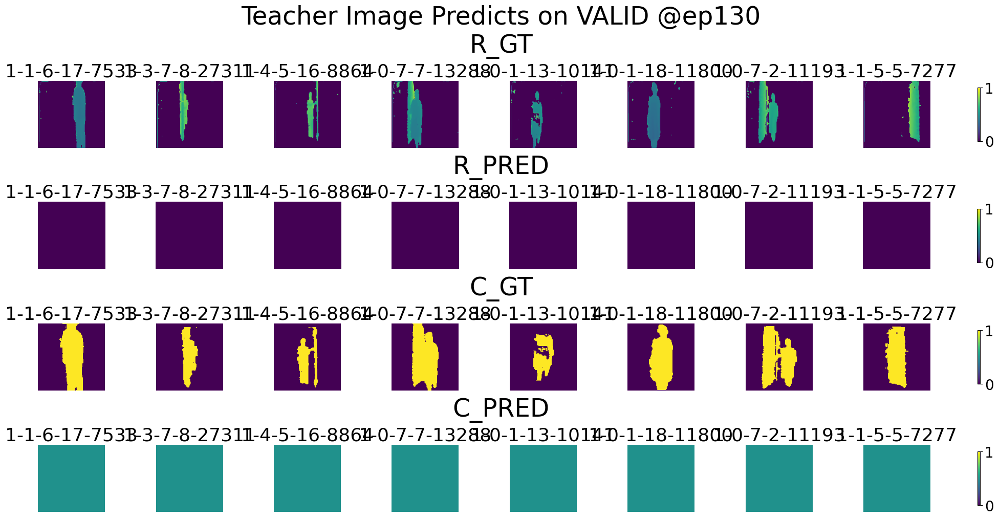

<Figure size 2000x1000 with 0 Axes>

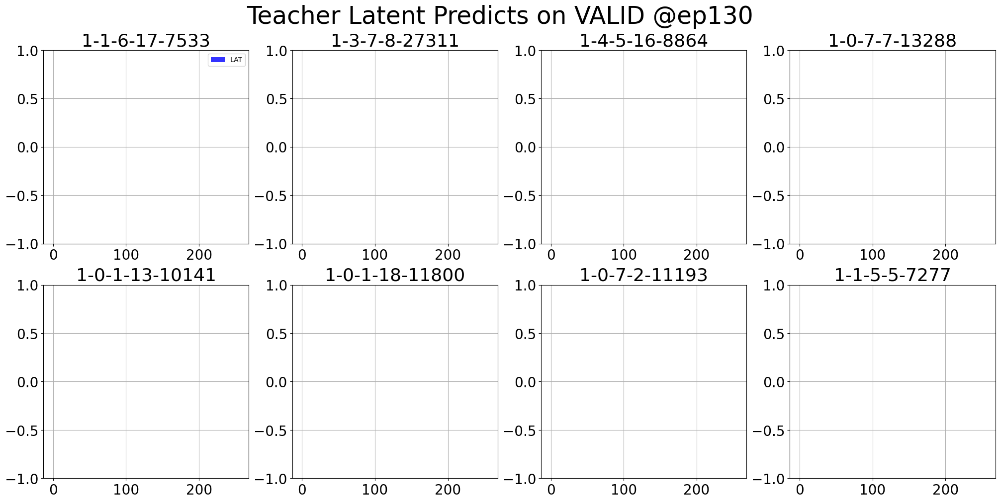

<Figure size 2000x1000 with 0 Axes>

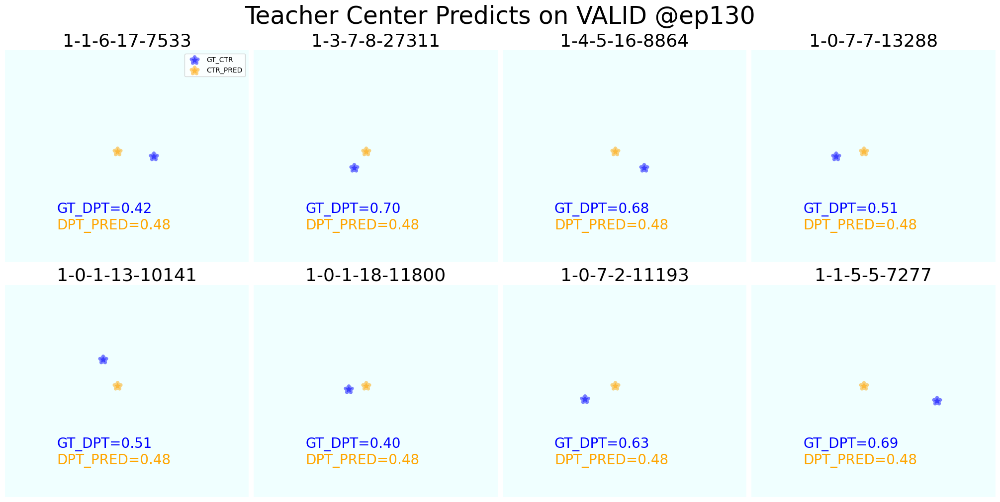

<Figure size 2000x1000 with 0 Axes>

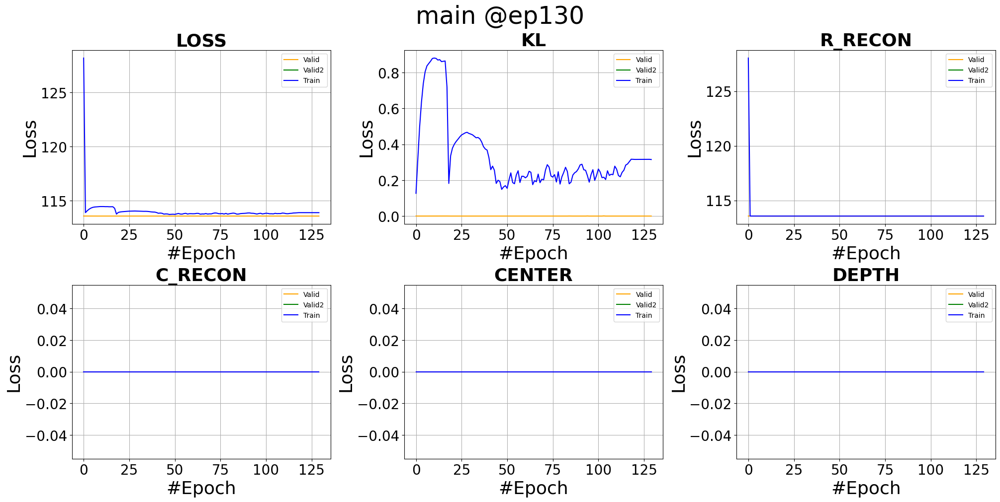

Early Stopping reporting: 3 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 4 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 5 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 6 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 7 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 8 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 9 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 10 out of 10
Lr decay reporting: 3 out of 5. Decay rate = 0.125



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 1 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 2 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

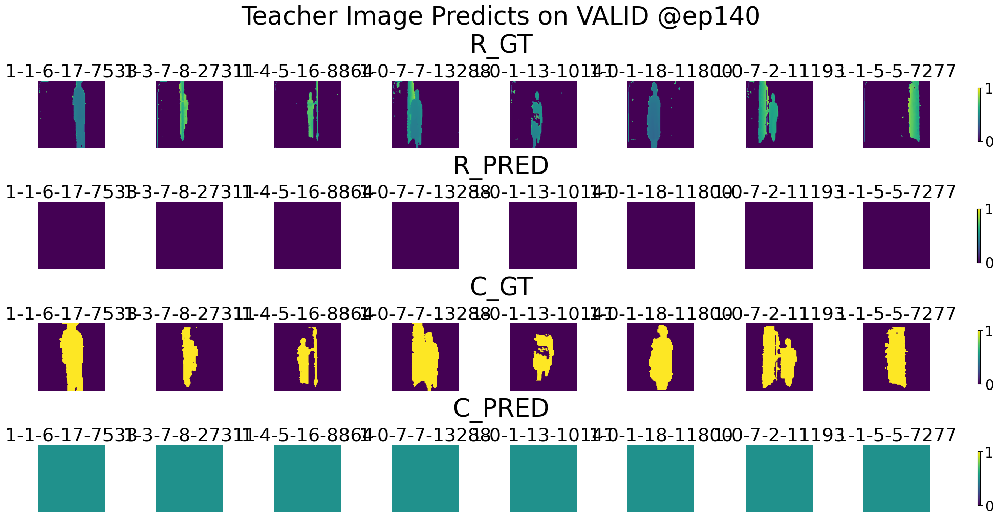

<Figure size 2000x1000 with 0 Axes>

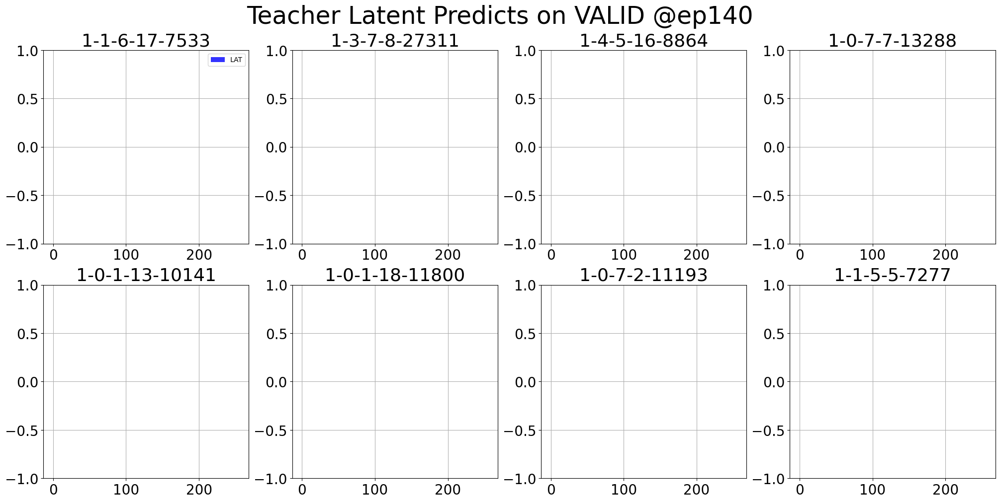

<Figure size 2000x1000 with 0 Axes>

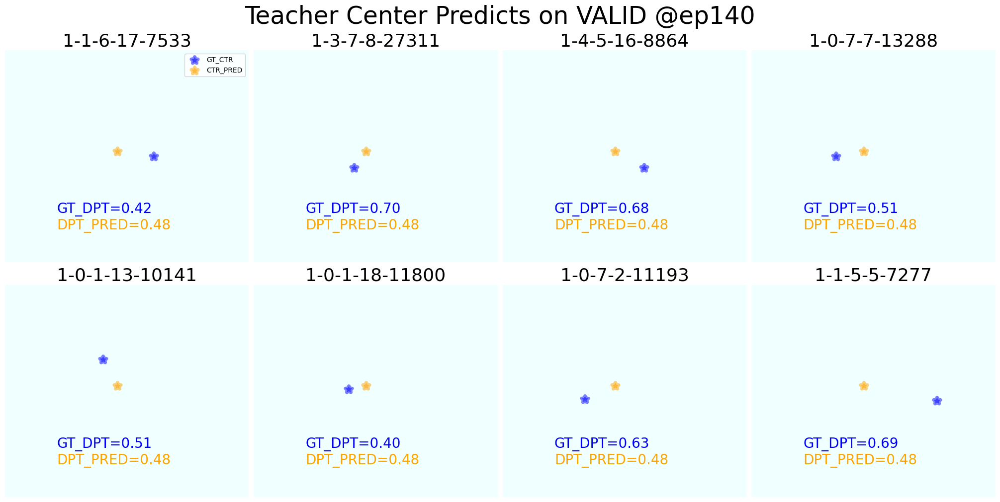

<Figure size 2000x1000 with 0 Axes>

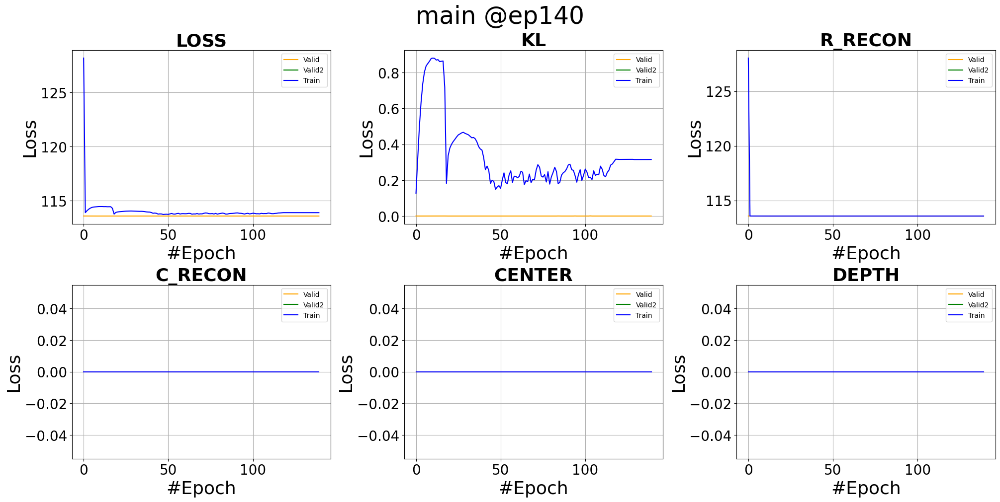

Early Stopping reporting: 3 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 4 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 5 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 6 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 7 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 8 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 9 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 10 out of 10
Lr decay reporting: 4 out of 5. Decay rate = 0.0625



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 1 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 2 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

<Figure size 2000x1000 with 0 Axes>

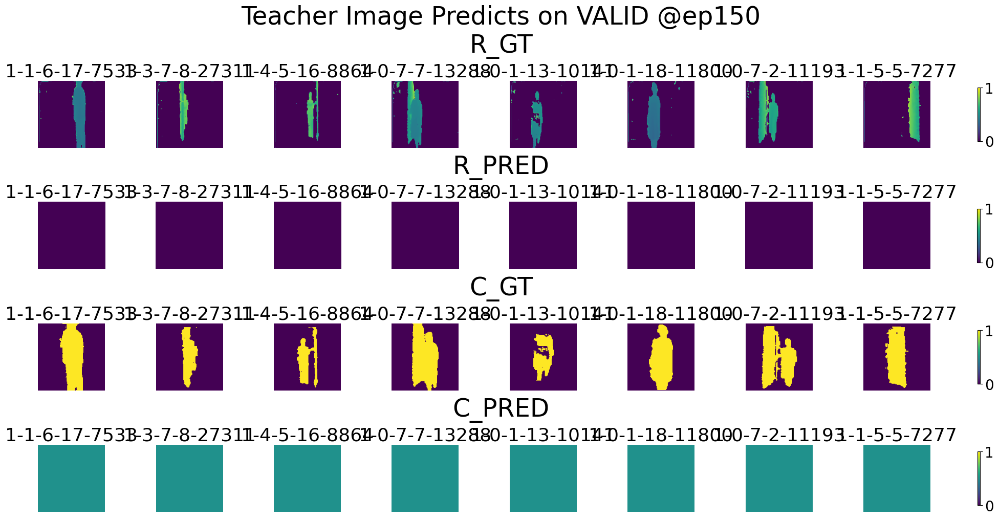

<Figure size 2000x1000 with 0 Axes>

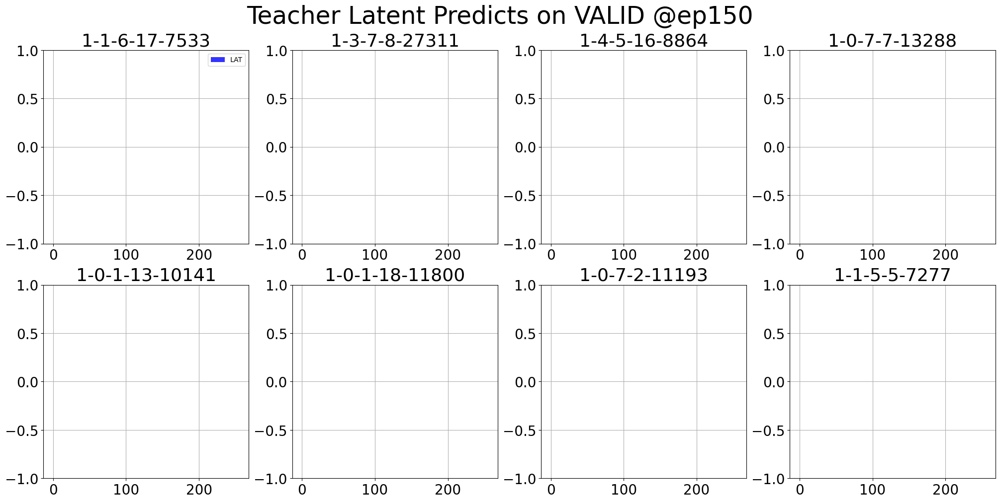

<Figure size 2000x1000 with 0 Axes>

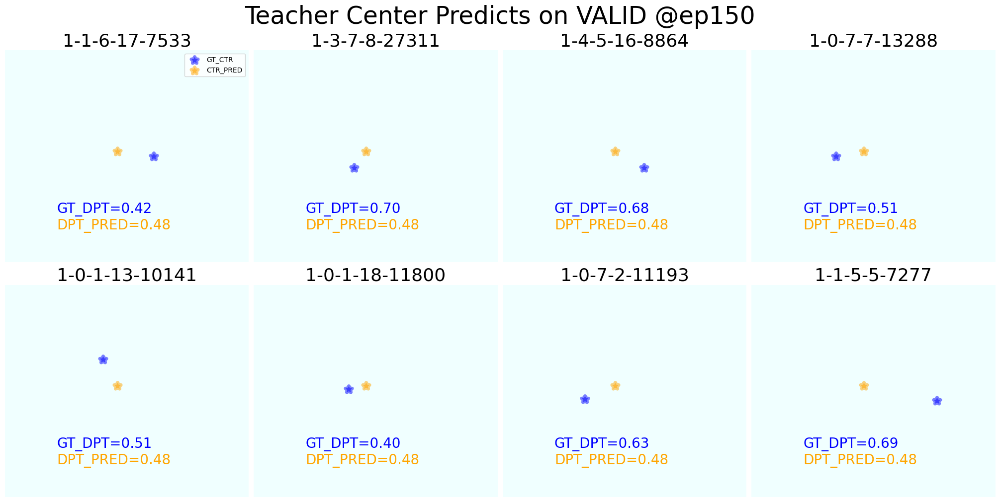

<Figure size 2000x1000 with 0 Axes>

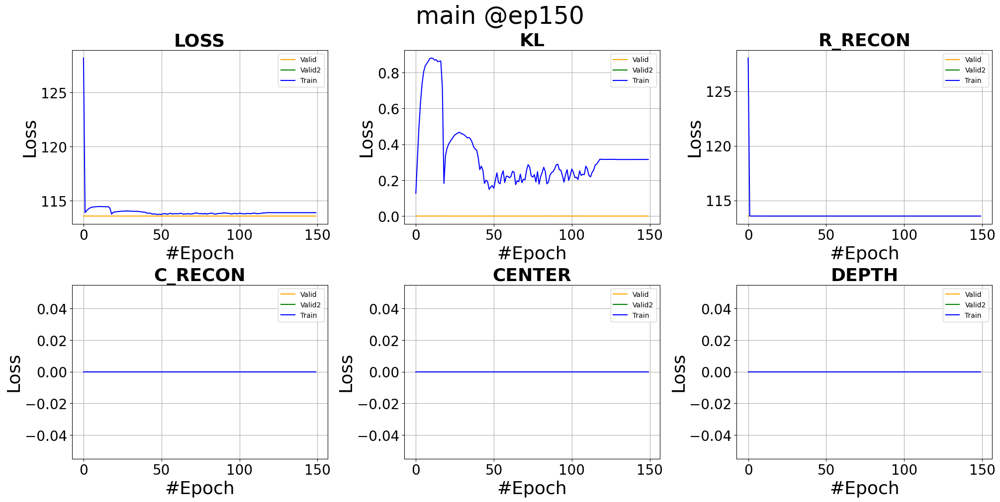

Saving models...
Saving imgen...
Saving cimgde...
Saving rimgde...
Saving ctrde...
Saving main optimizer...
All saved!
Early Stopping reporting: 3 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 4 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 5 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 6 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 7 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 8 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 9 out of 10



  0%|                                                                                                         …

  0%|                                                                                                         …

Early Stopping reporting: 10 out of 10
Lr decay reporting: 5 out of 5. Decay rate = 0.03125

Early Stopping triggered @ epoch 157
Saving models...
Saving imgen...
Saving cimgde...
Saving rimgde...
Saving ctrde...
Saving main optimizer...
All saved!
train elapsed: 2101.50914311409 sec


<Figure size 2000x1000 with 0 Axes>

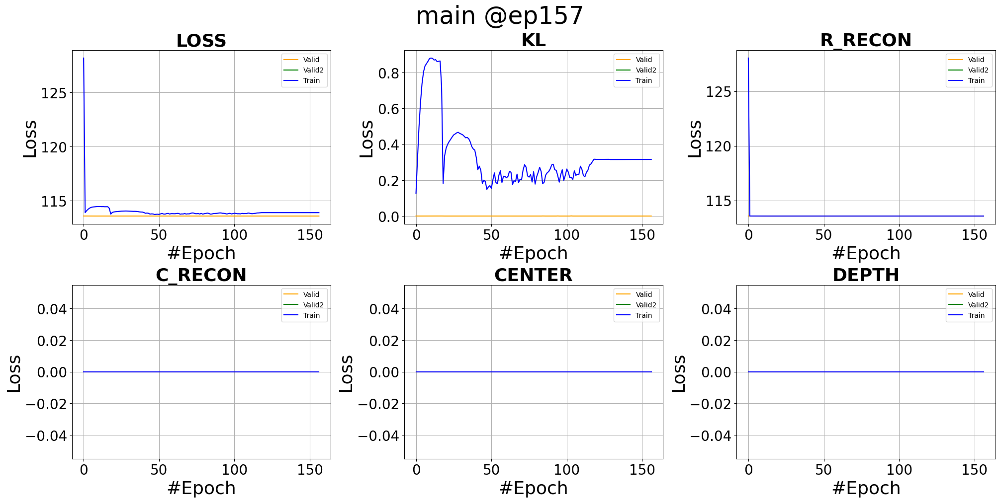

==========2025-05-22 08:40:58 2024_Door_RGB/Alpha/Teacher_GEGLU Teacher Test starting==========


  0%|                                                                                                         …


Test finished. Average loss={'LOSS': np.float64(113.56531362533569), 'KL': np.float64(8.122660219669341e-05), 'R_RECON': np.float64(113.56523132324219), 'C_RECON': np.float64(0.0), 'CENTER': np.float64(0.0), 'DEPTH': np.float64(0.0)}
test elapsed: 9.03160548210144 sec


<Figure size 2000x1000 with 0 Axes>

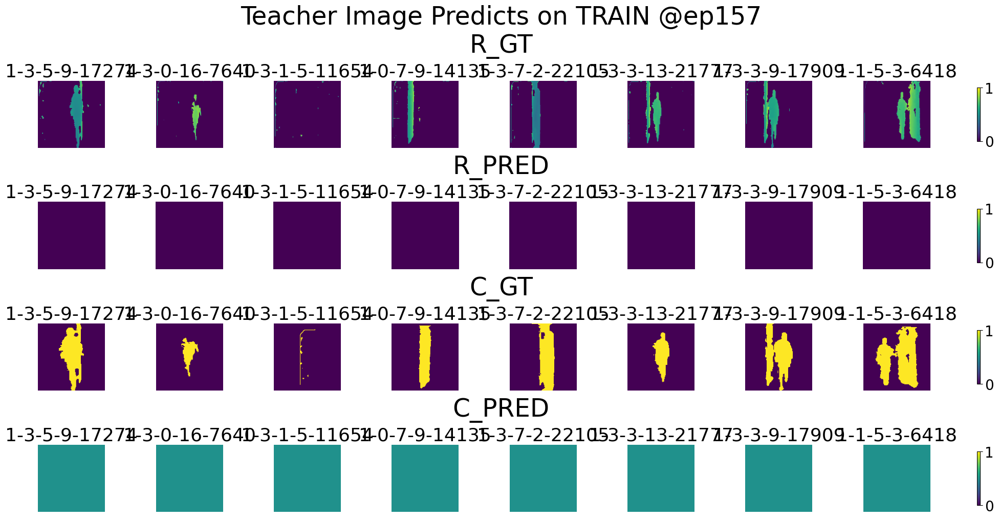

<Figure size 2000x1000 with 0 Axes>

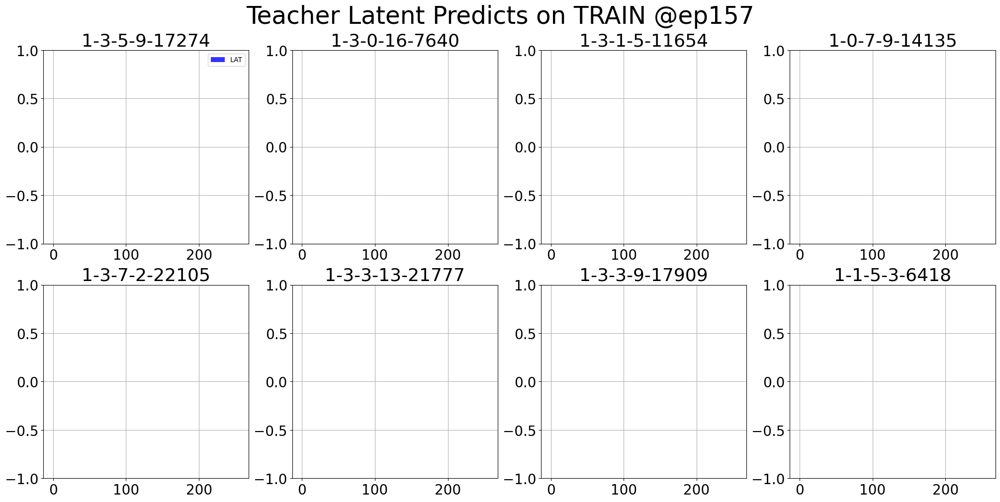

<Figure size 2000x1000 with 0 Axes>

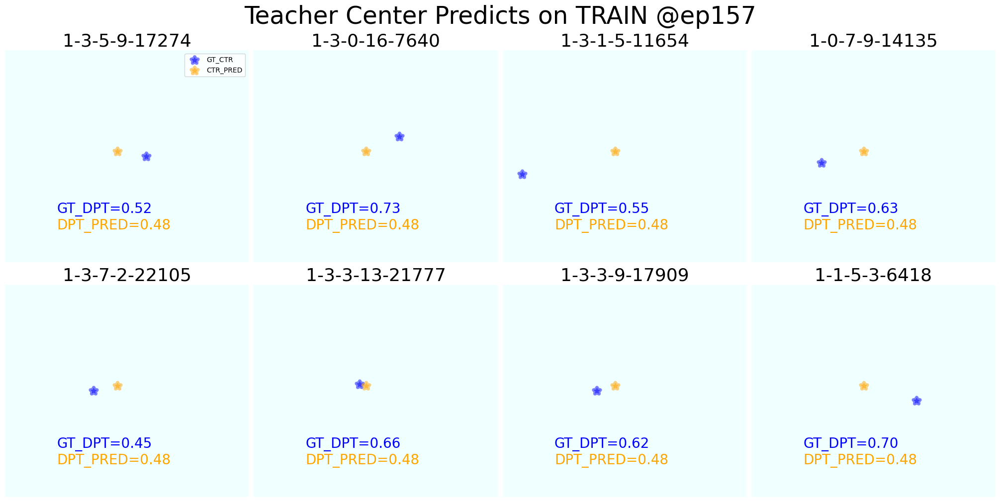

==========2025-05-22 08:41:13 2024_Door_RGB/Alpha/Teacher_GEGLU Teacher Test starting==========


  0%|                                                                                                         …


Test finished. Average loss={'LOSS': np.float64(113.56531459263392), 'KL': np.float64(8.157917431422642e-05), 'R_RECON': np.float64(113.56523132324219), 'C_RECON': np.float64(0.0), 'CENTER': np.float64(0.0), 'DEPTH': np.float64(0.0)}
test elapsed: 4.316336154937744 sec


<Figure size 2000x1000 with 0 Axes>

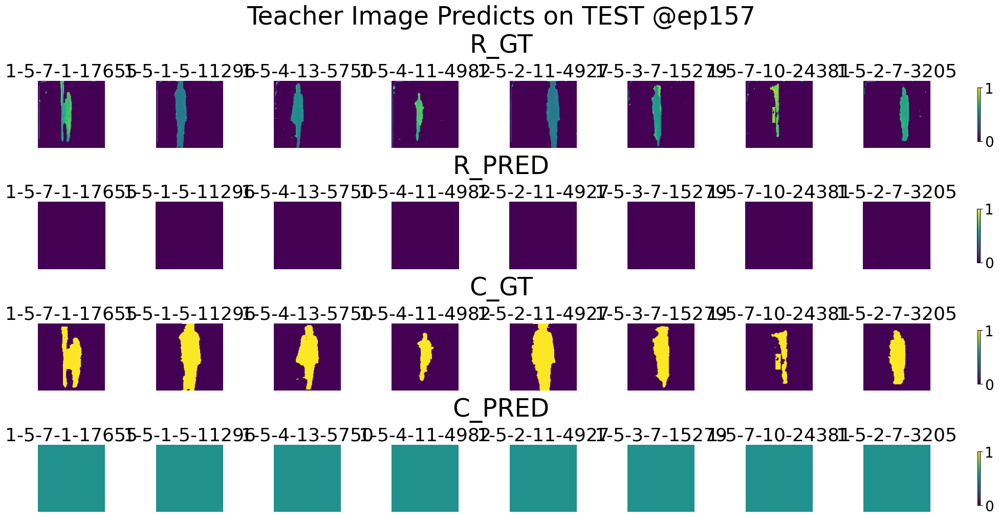

<Figure size 2000x1000 with 0 Axes>

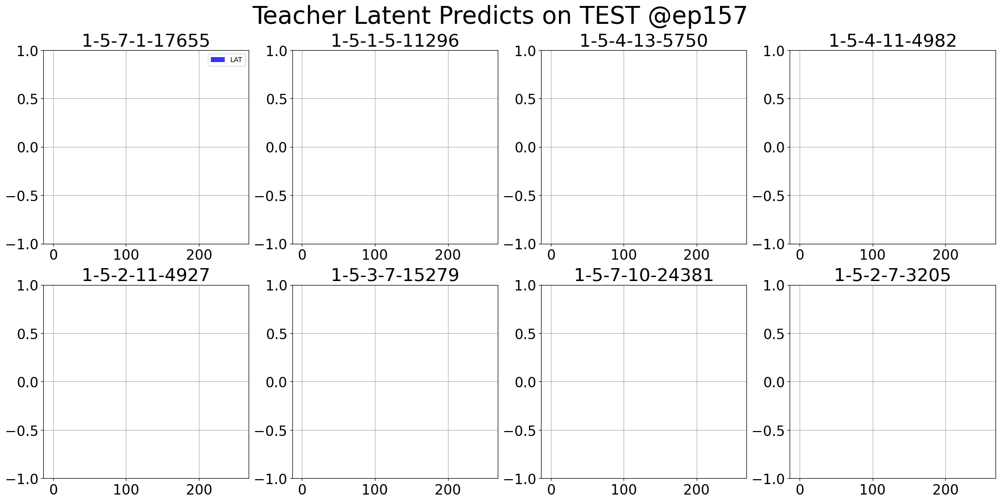

<Figure size 2000x1000 with 0 Axes>

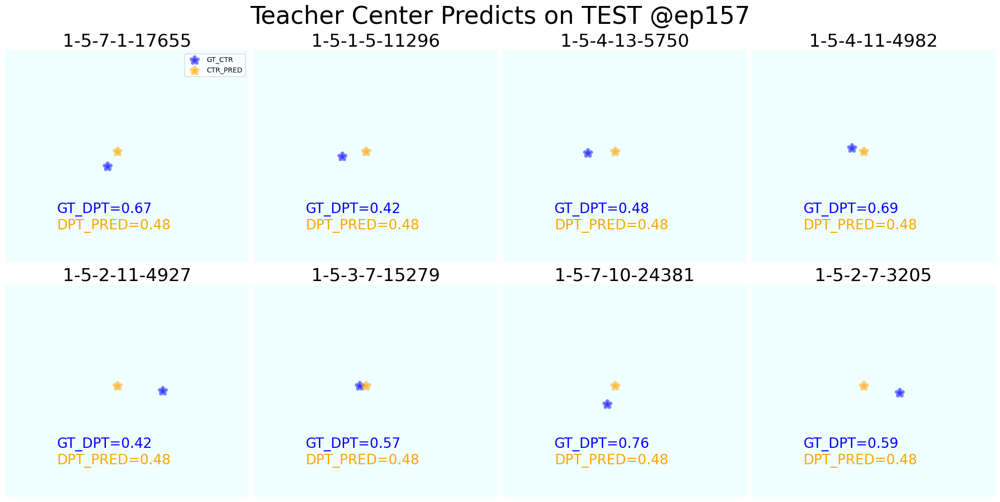

Saving preds: R_GT of len 2240...
Saving preds: C_GT of len 2240...
Saving preds: GT_DPT of len 2240...
Saving preds: GT_CTR of len 2240...
Saving preds: R_PRED of len 2240...
Saving preds: C_PRED of len 2240...
Saving preds: DPT_PRED of len 2240...
Saving preds: CTR_PRED of len 2240...
Saving preds: LAT of len 2240...
Saving preds: TAG of len 2240...
Saving preds: IND of len 2240...
All saved!

Teacher schedule Completed!


In [14]:
preprocess = DS.Preprocess(new_size=(128, 128))
gpu = 0
torch.cuda.set_device(gpu)
T_trainer = TP.TeacherTrainer(name='Teacher',
                              beta=0.5,
                              lstm_steps = 75,
                              lr=1e-4, epochs=50, cuda=gpu,
                              preprocess = preprocess,
                              notion=f'{name}',
                              dataloaders={
                                  'train': train_loader,
                                  'valid': valid_loader,
                                  'test': test_loader
                              },
                             )

T_trainer.weights = {
            'KL': 0.5,
            'R_RECON': 1.e-2,
            'C_RECON': 0,
            'CENTER': 0.,
            'DEPTH': 0.,
        }
T_trainer.training_phases['main'].lr = 1.e-4
T_trainer.schedule(early_stop=True, lr_decay=True)

In [ ]:
preprocess = DS.Preprocess(new_size=(128, 128))
data_organizer.load_plan('../dataset/Door_EXP/subject_r0.2.pkl')

def run_t():
    for i in range(6):
        data_organizer.gen_plan(subset_ratio=0.2)
        train_loader, valid_loader, test_loader, current_test = data_organizer.gen_loaders(mode='t')
        if current_test == 'higashinaka':
            continue
        T_trainer = TP.TeacherTrainer(beta=0.5,
                                  name='Teacher',
                                  loss_optimizer = {'LOSS': [torch.optim.Adam, 1e-4]},
                                  lr=1e-4, epochs=10, cuda=gpu,
                                      preprocess = preprocess,
                                  train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader,
                                  notion=f'{name}_{current_test}')

        T_trained = T_trainer.schedule(lr_decay=True)
        del T_trainer
        del T_trained
        torch.cuda.empty_cache()
        gc.collect()

Generating loaders for t: level = subject, current test = higashinaka
 Train dataset length = 9569
 Test dataset length = 2027
 Exported train loader of len 119, batch size = 64
 Exported valid loader of len 29, batch size = 64
 Exported test loader of len 2027, batch size = 1

==========20240919_Sub_Prop_higashinaka Teacher Training starting==========


  0%|          | 0/999 [00:00<?, ?it/s]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

<Figure size 432x288 with 0 Axes>

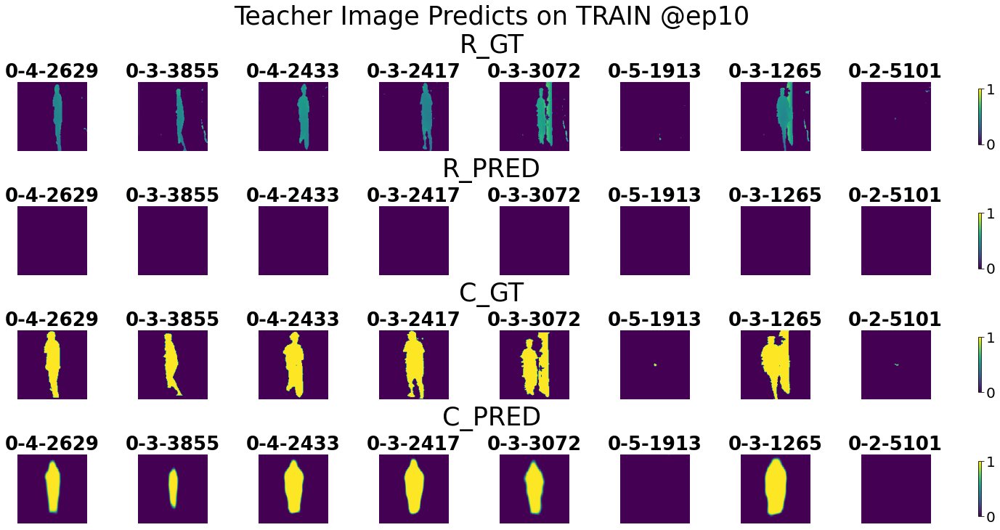

<Figure size 1440x720 with 0 Axes>

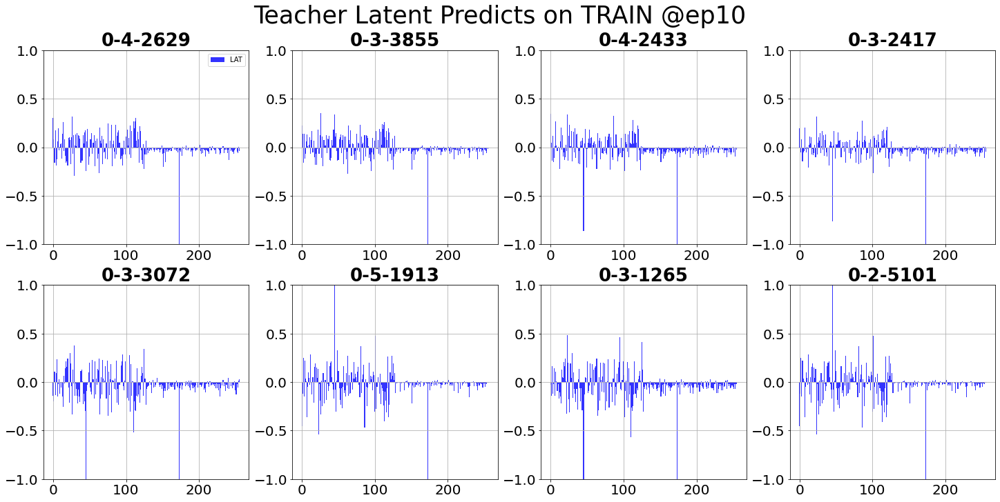

<Figure size 1440x720 with 0 Axes>

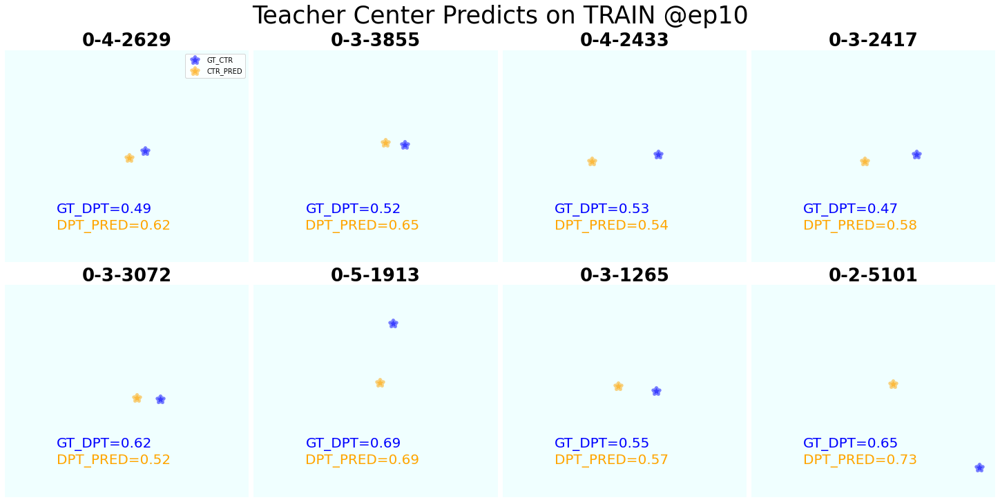

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

<Figure size 1440x720 with 0 Axes>

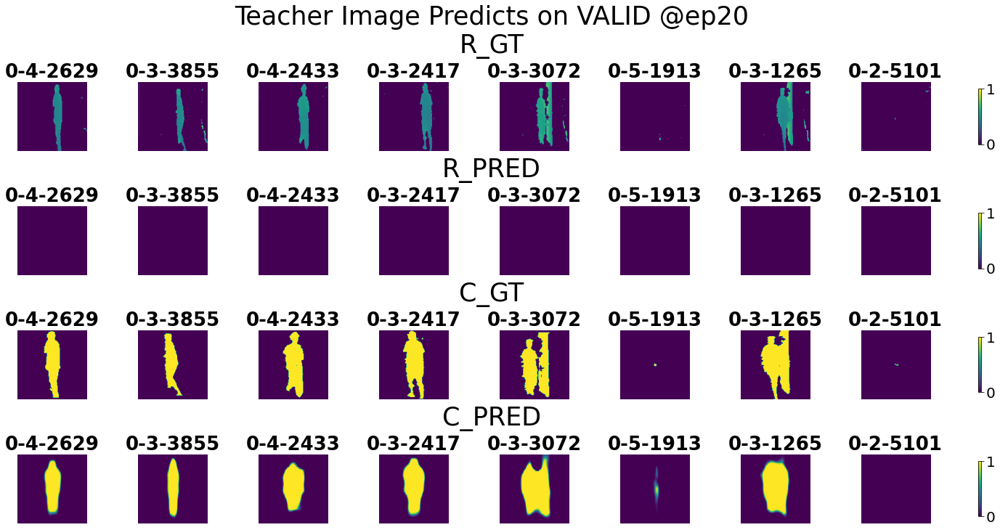

<Figure size 1440x720 with 0 Axes>

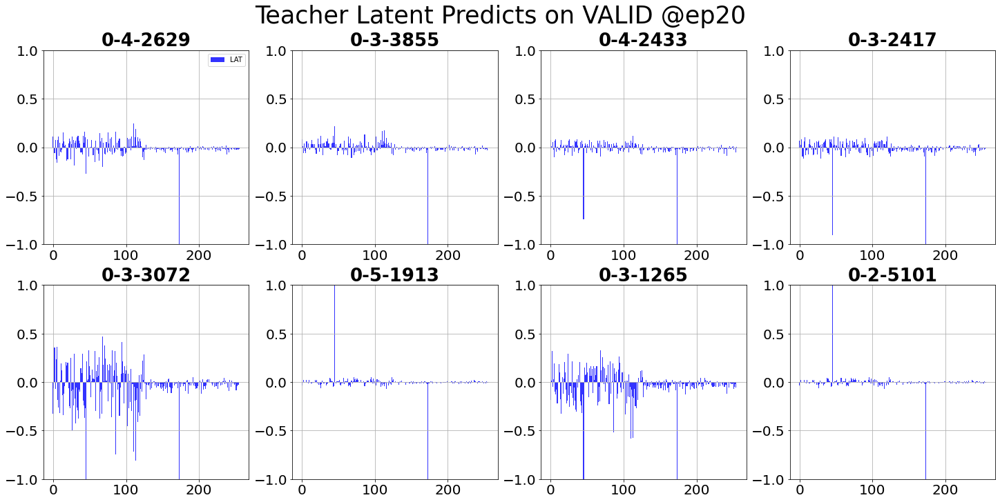

<Figure size 1440x720 with 0 Axes>

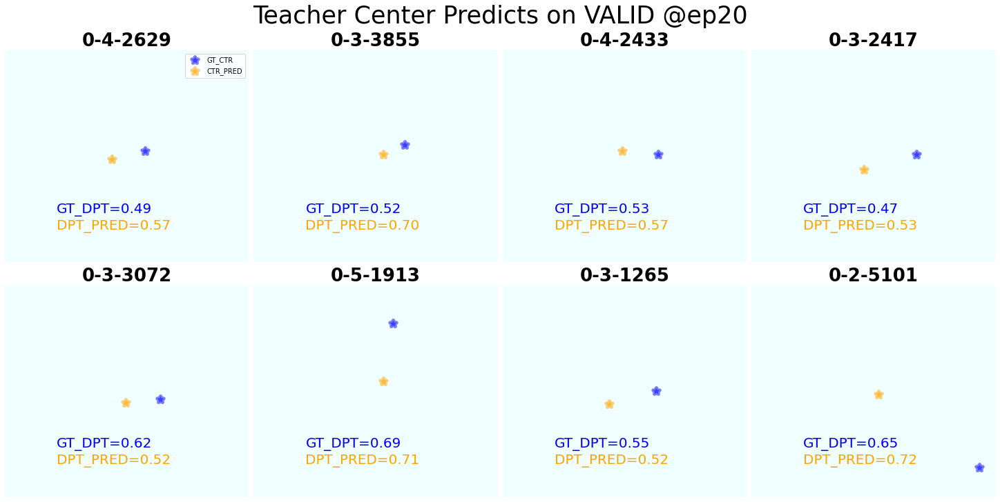

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

<Figure size 1440x720 with 0 Axes>

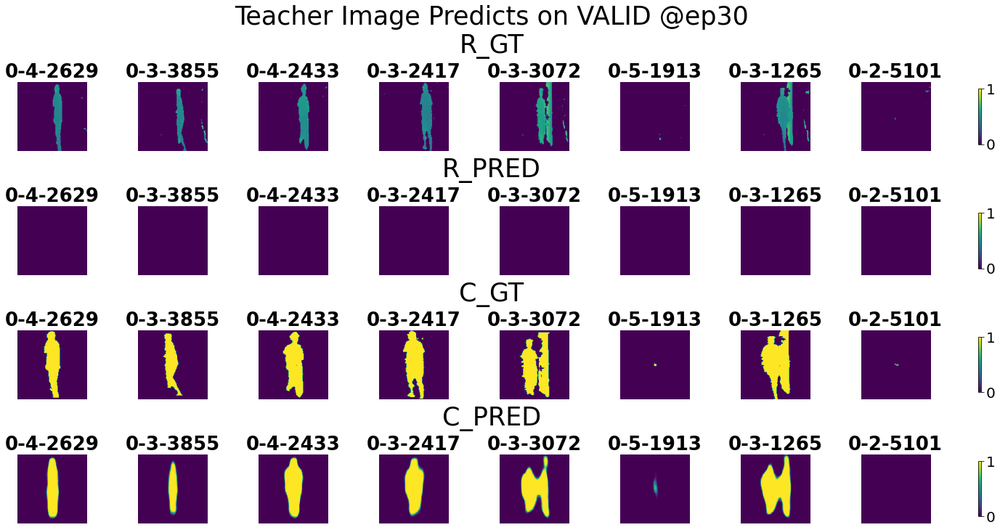

<Figure size 1440x720 with 0 Axes>

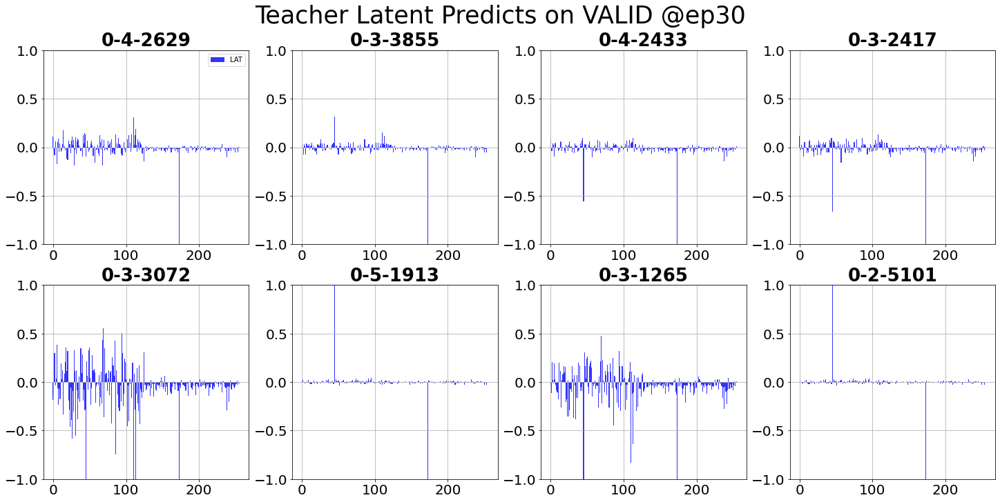

<Figure size 1440x720 with 0 Axes>

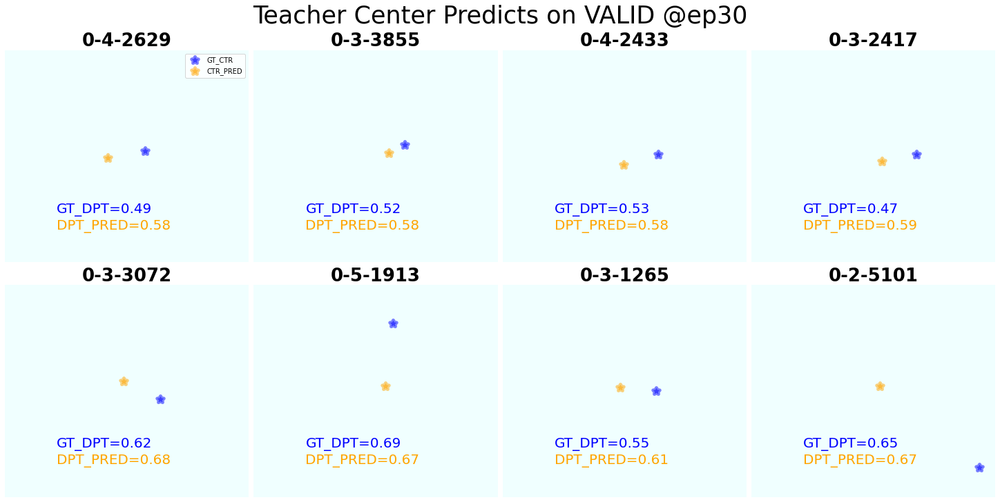

  0%|          |[00:00<?]

  0%|          |[00:00<?]

  0%|          |[00:00<?]

In [ ]:
gpu = 5
torch.cuda.set_device(gpu)
run_t()

### Student

In [4]:
preprocess = DS.Preprocess(new_size=(128, 128))
data_organizer.load_plan('../dataset/Door_EXP/subject_r0.2.pkl')

def run_s():
    train_loader, valid_loader, test_loader, current_test = data_organizer.gen_loaders(mode='s')

    S_trainer = TP.StudentTrainer(name='Student',
                                  lstm_steps = 75,
                                  beta=0.5,
                                  loss_optimizer = {'LOSS': [torch.optim.Adam, 1e-4]},
                                  lr=1e-4, epochs=10, cuda=gpu,
                                  preprocess = preprocess,
                                  notion=f'{name}_{current_test}',
                                  train_loader=train_loader, valid_loader=valid_loader, test_loader=test_loader,
                                 )
    S_trainer.models['imgen'].load_state_dict(torch.load(f"../saved/20240919_Sub_Prop_higashinaka/Teacher_imgen_best.pth"))
    S_trainer.models['cimgde'].load_state_dict(torch.load(f"../saved/20240919_Sub_Prop_higashinaka/Teacher_cimgde_best.pth"))
    S_trainer.models['rimgde'].load_state_dict(torch.load(f"../saved/20240919_Sub_Prop_higashinaka/Teacher_rimgde_best.pth"))
    S_trainer.models['ctrde'].load_state_dict(torch.load(f"../saved/20240919_Sub_Prop_higashinaka/Teacher_ctrde_best.pth"))
    S_trained = S_trainer.schedule(lr_decay=True, train_module={'csien'}, eval_module={'imgen', 'cimgde', 'rimgde', 'ctrde'})

Loaded plan!


In [5]:
gpu = 5
torch.cuda.set_device(gpu)
run_s()

Generating loaders for s: level = subject, current test = None


TypeError: 'NoneType' object is not subscriptable

In [ ]:
for i in range(6):
    train_loader, valid_loader, test_loader, current_test = data_organizer.gen_loaders(mode='s')
    print(current_test)